<a href="https://colab.research.google.com/github/faiza189/Multi-Class-Classification-of-Grape-Leaf-Diseases-Using-Deep-Learning-Approaches/blob/main/still_working_Grape_Leaf_Diseases.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Downloading and Importing Dataset**

# **Grape Disease Dataset**

This notebook downloads the Grapevine Disease Dataset (Original) from Kaggle, explores its structure, and plots multiple graphs to understand the distribution and characteristics of the data.

The dataset contains 9027 grape plant images classified into 4 categories:
- Black Rot
- ESCA (Black Measles)
- Leaf Blight (Isariopsis Leaf Spot)
- Healthy

## **Install Kaggle API and Upload Credentials**

Upload your kaggle.json file when prompted. You can download it from Kaggle by going to your profile Settings and clicking Create New Token under the API section.

In [3]:
from google.colab import files

files.upload()  # Upload kaggle.json when prompted
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

print("Kaggle credentials configured successfully.")

Saving kaggle.json to kaggle.json
Kaggle credentials configured successfully.


## **Download and Extract the Dataset**

In [4]:
!kaggle datasets download -d rm1000/grape-disease-dataset-original
!unzip -q grape-disease-dataset-original.zip -d grape_data

print("Dataset downloaded and extracted successfully.")

Dataset URL: https://www.kaggle.com/datasets/rm1000/grape-disease-dataset-original
License(s): CC0-1.0
100% 151M/151M [00:01<00:00, 141MB/s]

Dataset downloaded and extracted successfully.


## **Inspect the Folder Structure**

Before loading images, we check how the dataset is organized on disk so we can set the correct data directory path.

In [5]:
import os

base_dir = "grape_data"

for root, dirs, files_ in os.walk(base_dir):
    level = root.replace(base_dir, "").count(os.sep)
    indent = "  " * level
    print(f"{indent}{os.path.basename(root)}/  ({len(files_)} files)")
    if level >= 2:
        continue

grape_data/  (0 files)
  Original Data/  (0 files)
    train/  (0 files)
      Leaf Blight/  (1722 files)
      ESCA/  (1920 files)
      Healthy/  (1692 files)
      Black Rot/  (1888 files)
    test/  (0 files)
      Leaf Blight/  (430 files)
      ESCA/  (480 files)
      Healthy/  (423 files)
      Black Rot/  (472 files)


## **Import Required Libraries**

In [6]:
import os
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
from collections import Counter

sns.set_style("whitegrid")
print("All libraries imported successfully.")

All libraries imported successfully.


## **Build a DataFrame of Image Paths and Labels**

We scan all class folders, collect every image path along with its class label, and store them in a Pandas DataFrame for easy manipulation.

In [7]:
# Adjust this path if Step 3 shows a different folder structure
# For example: data_dir = "grape_data/Original Data/train"
data_dir = "grape_data/Original Data/train"

records = []
for class_name in sorted(os.listdir(data_dir)):
    class_path = os.path.join(data_dir, class_name)
    if os.path.isdir(class_path):
        for img_path in glob.glob(os.path.join(class_path, "*")):
            records.append({"filepath": img_path, "label": class_name})

df = pd.DataFrame(records)
print(f"Total images found: {len(df)}")
print(f"Number of classes: {df['label'].nunique()}")
print(f"\nClass names: {df['label'].unique().tolist()}")
print()
df.head(10)

Total images found: 7222
Number of classes: 4

Class names: ['Black Rot', 'ESCA', 'Healthy', 'Leaf Blight']



,filepath,label
0,grape_data/Original Data/train/Black Rot/74b13...,Black Rot
1,grape_data/Original Data/train/Black Rot/39c13...,Black Rot
2,grape_data/Original Data/train/Black Rot/e8fb9...,Black Rot
3,grape_data/Original Data/train/Black Rot/f8f3c...,Black Rot
4,grape_data/Original Data/train/Black Rot/0c736...,Black Rot
5,grape_data/Original Data/train/Black Rot/00cff...,Black Rot
6,grape_data/Original Data/train/Black Rot/f85b3...,Black Rot
7,grape_data/Original Data/train/Black Rot/0d907...,Black Rot
8,grape_data/Original Data/train/Black Rot/e433b...,Black Rot
9,grape_data/Original Data/train/Black Rot/42224...,Black Rot


## **Class Distribution Summary**

Print the number of images in each class to understand whether the dataset is balanced or imbalanced.

In [8]:
class_counts = df["label"].value_counts()
print("Images per class:")
print("-" * 40)
for cls, count in class_counts.items():
    pct = count / len(df) * 100
    print(f"{cls:40s} {count:5d}  ({pct:.1f}%)")
print("-" * 40)
print(f"{'Total':40s} {len(df):5d}")

Images per class:
----------------------------------------
ESCA                                      1920  (26.6%)
Black Rot                                 1888  (26.1%)
Leaf Blight                               1722  (23.8%)
Healthy                                   1692  (23.4%)
----------------------------------------
Total                                     7222


## **Bar Chart - Number of Images per Class**

/tmp/ipykernel_1214/2243207738.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(


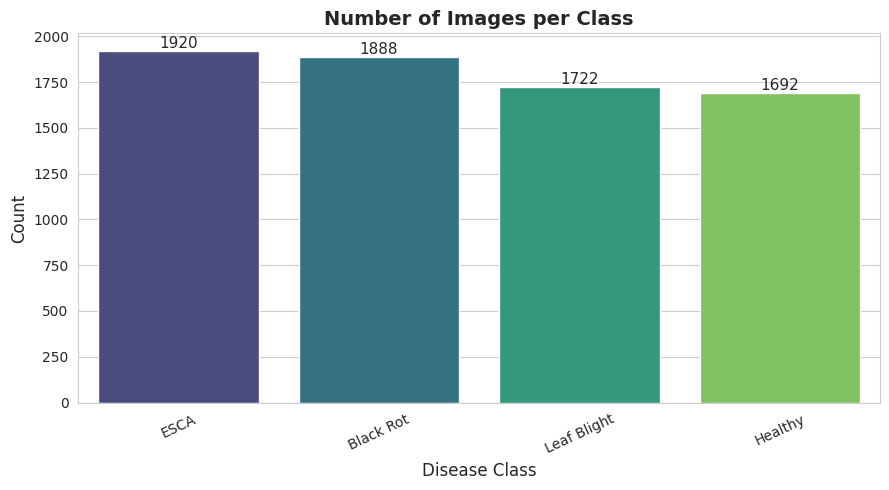

In [9]:
plt.figure(figsize=(9, 5))
ax = sns.countplot(
    data=df, x="label",
    order=df["label"].value_counts().index,
    palette="viridis"
)
for container in ax.containers:
    ax.bar_label(container, fmt="%d", fontsize=11)
plt.title("Number of Images per Class", fontsize=14, fontweight="bold")
plt.xlabel("Disease Class", fontsize=12)
plt.ylabel("Count", fontsize=12)
plt.xticks(rotation=25)
plt.tight_layout()
plt.show()

## **Pie Chart - Class Proportions**

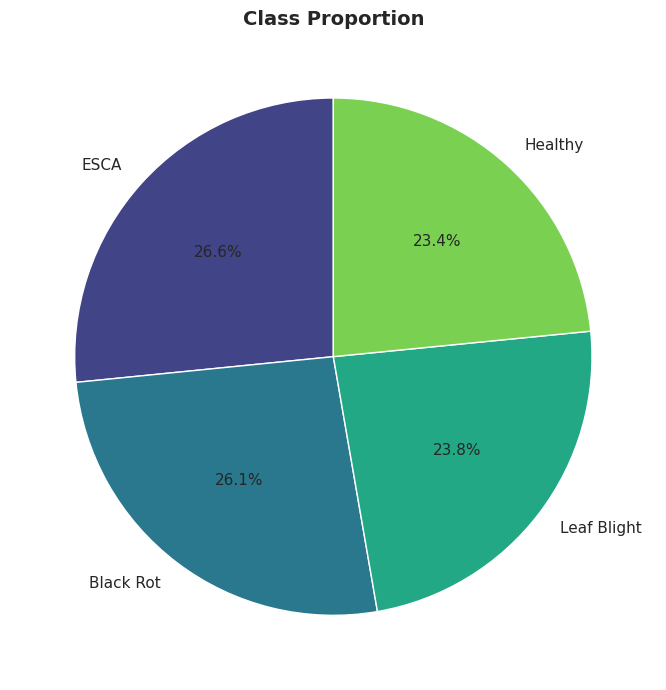

In [10]:
plt.figure(figsize=(7, 7))
colors = sns.color_palette("viridis", n_colors=df["label"].nunique())
df["label"].value_counts().plot.pie(
    autopct="%1.1f%%",
    startangle=90,
    colors=colors,
    textprops={"fontsize": 11}
)
plt.title("Class Proportion", fontsize=14, fontweight="bold")
plt.ylabel("")
plt.tight_layout()
plt.show()

## **Sample Images from Each Class**

Display 5 random sample images per class to visually inspect the data quality and understand the visual differences between classes.

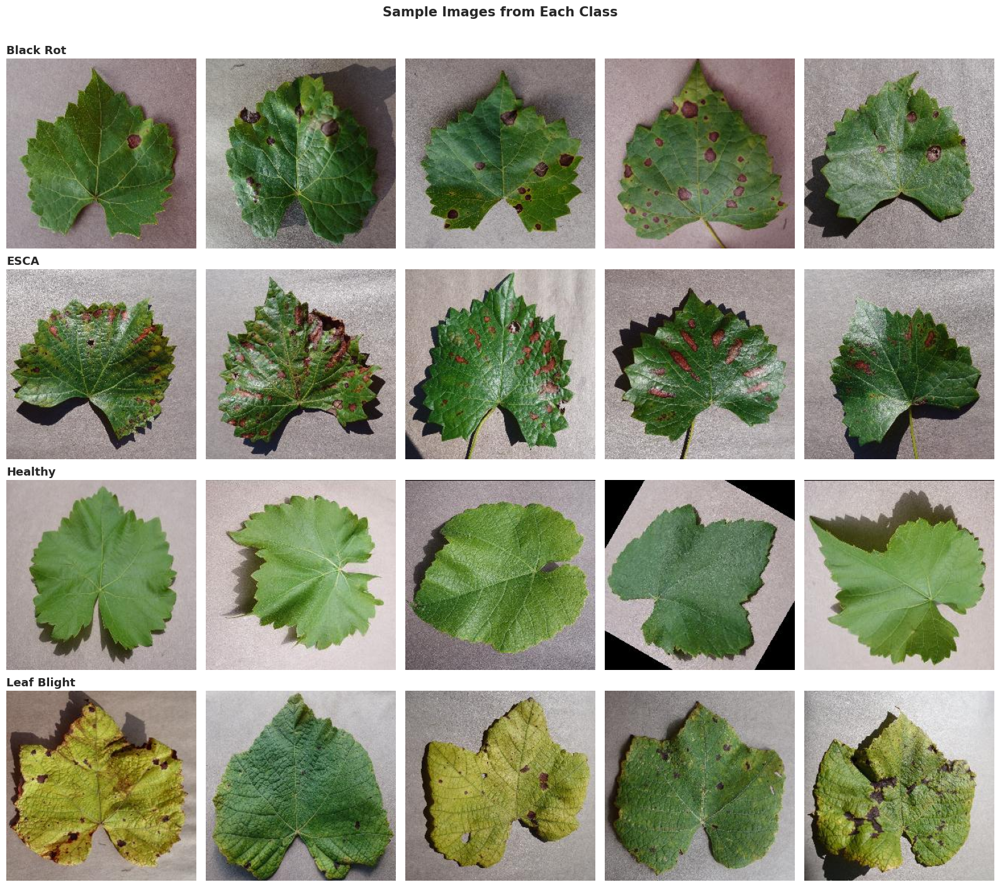

In [11]:
classes = sorted(df["label"].unique())
n_samples = 5

fig, axes = plt.subplots(len(classes), n_samples, figsize=(16, 3.5 * len(classes)))

for i, cls in enumerate(classes):
    sample_paths = df[df["label"] == cls]["filepath"].sample(n_samples, random_state=42).values
    for j, path in enumerate(sample_paths):
        img = Image.open(path)
        axes[i, j].imshow(img)
        axes[i, j].axis("off")
    axes[i, 0].set_title(cls, fontsize=13, fontweight="bold", loc="left")

plt.suptitle("Sample Images from Each Class", fontsize=15, fontweight="bold", y=1.01)
plt.tight_layout()
plt.show()

## **Image Dimensions Analysis**

Analyze the width and height distributions of the images. This is important for deciding the input size when training a model.

In [12]:
sample_size = min(500, len(df))
sample_df = df.sample(sample_size, random_state=42).copy()

widths = []
heights = []
for path in sample_df["filepath"]:
    img = Image.open(path)
    w, h = img.size
    widths.append(w)
    heights.append(h)

sample_df["width"] = widths
sample_df["height"] = heights

print(f"Width  - Min: {min(widths)}, Max: {max(widths)}, Mean: {np.mean(widths):.0f}")
print(f"Height - Min: {min(heights)}, Max: {max(heights)}, Mean: {np.mean(heights):.0f}")

Width  - Min: 256, Max: 256, Mean: 256
Height - Min: 256, Max: 256, Mean: 256


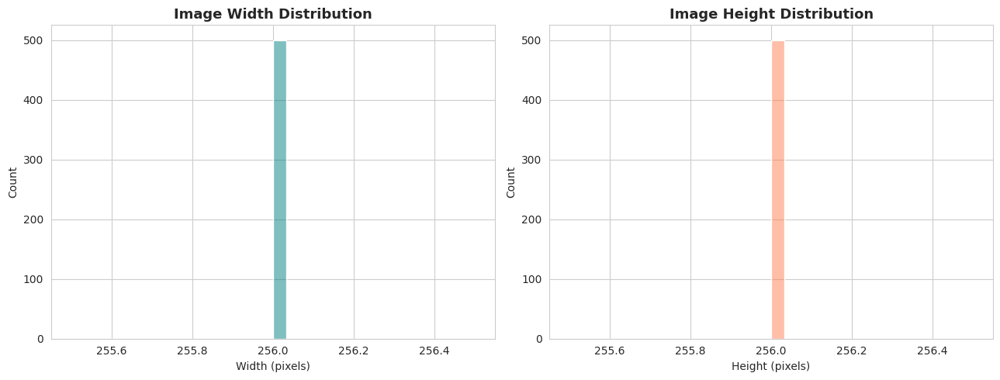

In [10]:
fig, axes = plt.subplots(1, 2, figsize=(13, 5))

sns.histplot(sample_df["width"], ax=axes[0], kde=True, color="teal", bins=30)
axes[0].set_title("Image Width Distribution", fontsize=13, fontweight="bold")
axes[0].set_xlabel("Width (pixels)")

sns.histplot(sample_df["height"], ax=axes[1], kde=True, color="coral", bins=30)
axes[1].set_title("Image Height Distribution", fontsize=13, fontweight="bold")
axes[1].set_xlabel("Height (pixels)")

plt.tight_layout()
plt.show()

# **Model Training and Evaluation**

In this section I split the dataset, apply data augmentation, train a baseline CNN and a transfer learning model (EfficientNetB0), and evaluate both using accuracy, loss curves, confusion matrix, and classification report.

## **Install and Import Required Libraries**

In [13]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import (Conv2D, MaxPooling2D, Flatten, Dense,
                                     Dropout, BatchNormalization, GlobalAveragePooling2D)
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.applications import EfficientNetB0
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os

print(f"TensorFlow version: {tf.__version__}")
print(f"GPU available: {tf.config.list_physical_devices('GPU')}")

TensorFlow version: 2.20.0
GPU available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


## **Define Constants and Data Directory**

In [14]:
IMG_SIZE = 224
BATCH_SIZE = 32
EPOCHS = 15
NUM_CLASSES = 4

# Adjust this path based on your folder structure from the exploration step
data_dir = "grape_data/Original Data/train"

class_names = sorted(os.listdir(data_dir))
print(f"Classes: {class_names}")
print(f"Image size: {IMG_SIZE}x{IMG_SIZE}")
print(f"Batch size: {BATCH_SIZE}")

Classes: ['Black Rot', 'ESCA', 'Healthy', 'Leaf Blight']
Image size: 224x224
Batch size: 32


## **Split Data into Training, Validation, and Test Sets**

We use ImageDataGenerator to split the data into 70% training, 15% validation, and 15% test. Training data will also receive augmentation to improve generalisation.

In [15]:
# Training data with augmentation (70%)
train_datagen = ImageDataGenerator(
    rescale=1.0 / 255,
    validation_split=0.30,
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True,
    vertical_flip=True,
    zoom_range=0.2,
    brightness_range=[0.8, 1.2],
    fill_mode="nearest"
)

# Validation and test data without augmentation
val_test_datagen = ImageDataGenerator(
    rescale=1.0 / 255,
    validation_split=0.30
)

train_generator = train_datagen.flow_from_directory(
    data_dir,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    subset="training",
    shuffle=True,
    seed=42
)

val_generator = val_test_datagen.flow_from_directory(
    data_dir,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    subset="validation",
    shuffle=False,
    seed=42
)

print(f"\nTraining samples: {train_generator.samples}")
print(f"Validation samples: {val_generator.samples}")
print(f"Class indices: {train_generator.class_indices}")

Found 5057 images belonging to 4 classes.
Found 2165 images belonging to 4 classes.

Training samples: 5057
Validation samples: 2165
Class indices: {'Black Rot': 0, 'ESCA': 1, 'Healthy': 2, 'Leaf Blight': 3}


## **Visualise Augmented Training Images**

Display a batch of augmented images to verify that the augmentation pipeline is working correctly.

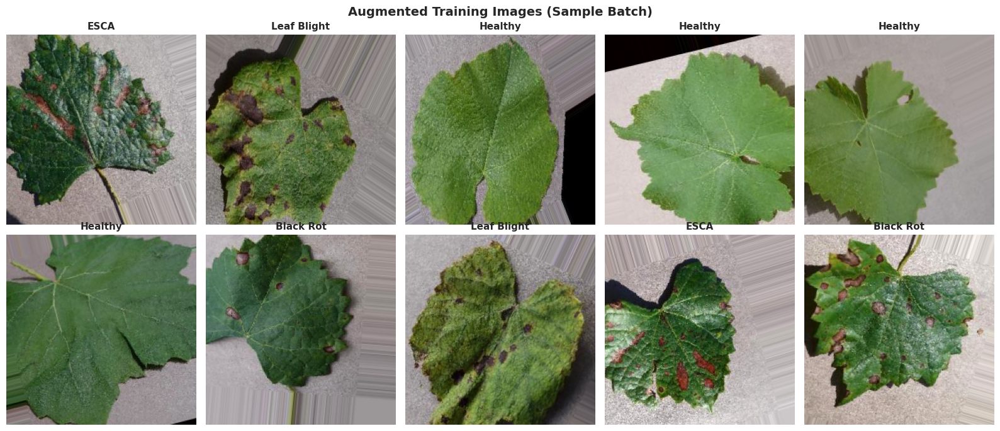

In [16]:
images, labels = next(train_generator)
class_labels = list(train_generator.class_indices.keys())

fig, axes = plt.subplots(2, 5, figsize=(16, 7))
for i, ax in enumerate(axes.flat):
    ax.imshow(images[i])
    label_index = np.argmax(labels[i])
    ax.set_title(class_labels[label_index], fontsize=11, fontweight="bold")
    ax.axis("off")

plt.suptitle("Augmented Training Images (Sample Batch)", fontsize=14, fontweight="bold")
plt.tight_layout()
plt.show()

# **Build the Baseline CNN Model**

A custom CNN with three convolutional blocks followed by fully connected layers. This serves as the baseline to compare against transfer learning.

In [17]:
def build_baseline_cnn(input_shape=(IMG_SIZE, IMG_SIZE, 3), num_classes=NUM_CLASSES):
    model = Sequential([
        Conv2D(32, (3, 3), activation="relu", padding="same", input_shape=input_shape),
        BatchNormalization(),
        MaxPooling2D((2, 2)),

        Conv2D(64, (3, 3), activation="relu", padding="same"),
        BatchNormalization(),
        MaxPooling2D((2, 2)),

        Conv2D(128, (3, 3), activation="relu", padding="same"),
        BatchNormalization(),
        MaxPooling2D((2, 2)),

        Conv2D(256, (3, 3), activation="relu", padding="same"),
        BatchNormalization(),
        MaxPooling2D((2, 2)),

        Flatten(),
        Dense(256, activation="relu"),
        Dropout(0.5),
        Dense(128, activation="relu"),
        Dropout(0.3),
        Dense(num_classes, activation="softmax")
    ])
    return model

cnn_model = build_baseline_cnn()
cnn_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4, clipnorm=1.0),  # clipnorm guards against exploding gradients
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)
cnn_model.summary()

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 28, 28, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 28, 28, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 14, 14, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 50176)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │    12,845,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 4)              │           516 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 13,269,060 (50.62 MB)

 Trainable params: 13,268,100 (50.61 MB)

 Non-trainable params: 960 (3.75 KB)

## **Train the Baseline CNN Model**

In [18]:
cnn_callbacks = [
    EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True),
    ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=2, min_lr=1e-6)
]

cnn_history = cnn_model.fit(
    train_generator,
    epochs=EPOCHS,
    validation_data=val_generator,
    callbacks=cnn_callbacks,
    verbose=1
)

Epoch 1/15
159/159 ━━━━━━━━━━━━━━━━━━━━ 101s 544ms/step - accuracy: 0.6346 - loss: 1.1719 - val_accuracy: 0.2342 - val_loss: 7.5689 - learning_rate: 1.0000e-04
Epoch 2/15
159/159 ━━━━━━━━━━━━━━━━━━━━ 84s 527ms/step - accuracy: 0.7390 - loss: 0.7299 - val_accuracy: 0.4540 - val_loss: 10.7149 - learning_rate: 1.0000e-04
Epoch 3/15
159/159 ━━━━━━━━━━━━━━━━━━━━ 78s 491ms/step - accuracy: 0.8090 - loss: 0.5775 - val_accuracy: 0.4610 - val_loss: 7.0998 - learning_rate: 1.0000e-04
Epoch 4/15
159/159 ━━━━━━━━━━━━━━━━━━━━ 78s 492ms/step - accuracy: 0.8363 - loss: 0.5108 - val_accuracy: 0.7483 - val_loss: 0.8465 - learning_rate: 1.0000e-04
Epoch 5/15
159/159 ━━━━━━━━━━━━━━━━━━━━ 77s 482ms/step - accuracy: 0.8568 - loss: 0.4534 - val_accuracy: 0.7875 - val_loss: 0.7039 - learning_rate: 1.0000e-04
Epoch 6/15
159/159 ━━━━━━━━━━━━━━━━━━━━ 77s 482ms/step - accuracy: 0.8819 - loss: 0.4002 - val_accuracy: 0.8785 - val_loss: 0.3729 - learning_rate: 1.0000e-04
Epoch 7/15
159/159 ━━━━━━━━━━━━━━━━━━━━ 77s 

68/68 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step
Classification Report:

              precision    recall  f1-score   support

   Black Rot       0.99      0.61      0.75       566
        ESCA       0.83      0.98      0.90       576
     Healthy       0.86      1.00      0.92       507
 Leaf Blight       0.95      1.00      0.97       516

    accuracy                           0.89      2165
   macro avg       0.91      0.90      0.89      2165
weighted avg       0.91      0.89      0.88      2165



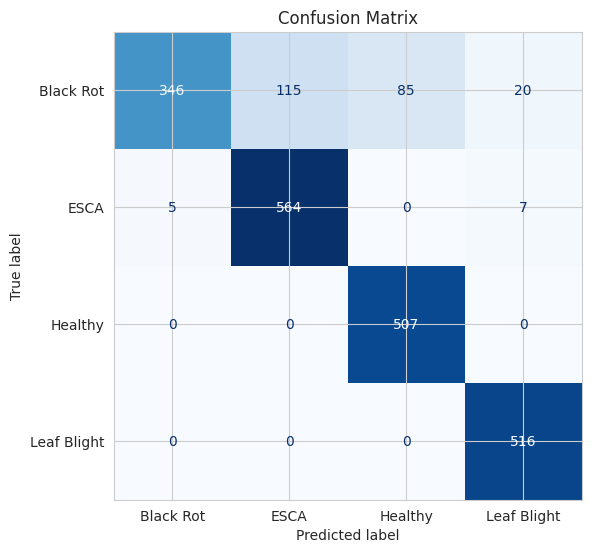

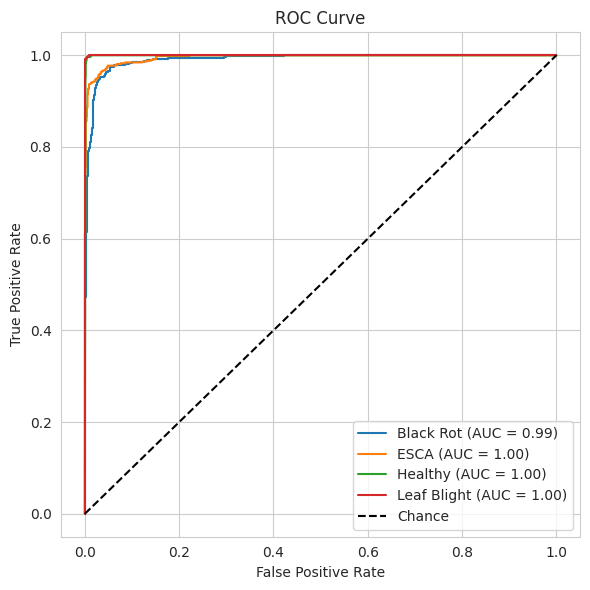

In [20]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import (
    confusion_matrix, ConfusionMatrixDisplay,
    classification_report, roc_curve, auc, roc_auc_score
)

# --- Get true labels and predicted probabilities ---
val_generator.reset()  # ensure predictions align with labels in order
y_true = val_generator.classes
class_labels = list(val_generator.class_indices.keys())

y_pred_probs = cnn_model.predict(val_generator, verbose=1)

# --- Handle binary vs multiclass output shapes ---
if y_pred_probs.shape[1] == 1:
    # Binary classification with sigmoid output
    y_pred = (y_pred_probs.ravel() > 0.5).astype(int)
    y_scores = y_pred_probs.ravel()
else:
    # Multiclass with softmax output
    y_pred = np.argmax(y_pred_probs, axis=1)
    y_scores = y_pred_probs

# --- Classification Report ---
print("Classification Report:\n")
print(classification_report(y_true, y_pred, target_names=class_labels))

# --- Confusion Matrix ---
cm = confusion_matrix(y_true, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels)
fig, ax = plt.subplots(figsize=(6, 6))
disp.plot(ax=ax, cmap='Blues', colorbar=False)
plt.title("Confusion Matrix")
plt.tight_layout()
plt.show()

# --- ROC Curve ---
plt.figure(figsize=(6, 6))

if y_pred_probs.shape[1] == 1:
    # Binary case
    fpr, tpr, _ = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f"ROC curve (AUC = {roc_auc:.2f})")
else:
    # Multiclass case: one-vs-rest ROC per class
    from sklearn.preprocessing import label_binarize
    y_true_bin = label_binarize(y_true, classes=range(len(class_labels)))
    for i, label in enumerate(class_labels):
        fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_scores[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f"{label} (AUC = {roc_auc:.2f})")

plt.plot([0, 1], [0, 1], 'k--', label="Chance")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend(loc="lower right")
plt.tight_layout()
plt.show()

## **Plot Training and Validation Accuracy and Loss for Baseline CNN**

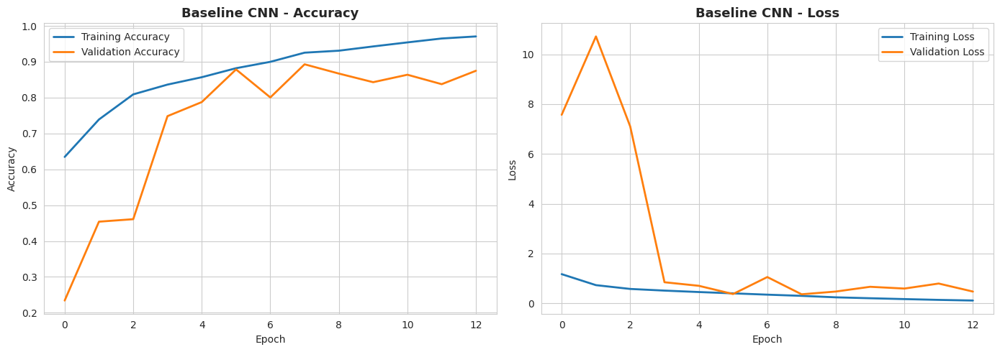

In [21]:
def plot_training_history(history, model_name):
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    axes[0].plot(history.history["accuracy"], label="Training Accuracy", linewidth=2)
    axes[0].plot(history.history["val_accuracy"], label="Validation Accuracy", linewidth=2)
    axes[0].set_title(f"{model_name} - Accuracy", fontsize=13, fontweight="bold")
    axes[0].set_xlabel("Epoch")
    axes[0].set_ylabel("Accuracy")
    axes[0].legend(fontsize=10)
    axes[0].grid(True)

    axes[1].plot(history.history["loss"], label="Training Loss", linewidth=2)
    axes[1].plot(history.history["val_loss"], label="Validation Loss", linewidth=2)
    axes[1].set_title(f"{model_name} - Loss", fontsize=13, fontweight="bold")
    axes[1].set_xlabel("Epoch")
    axes[1].set_ylabel("Loss")
    axes[1].legend(fontsize=10)
    axes[1].grid(True)

    plt.tight_layout()
    plt.show()

plot_training_history(cnn_history, "Baseline CNN")

# **Training and Evaluating MobileNetV2**

In [22]:
from tensorflow.keras.applications import MobileNetV2

def build_mobilenetv2(input_shape=(IMG_SIZE, IMG_SIZE, 3), num_classes=NUM_CLASSES):
    base_model = MobileNetV2(
        weights="imagenet",
        include_top=False,
        input_shape=input_shape
    )
    base_model.trainable = False

    inputs = tf.keras.Input(shape=input_shape)

    # MobileNetV2 also has its own internal preprocessing and expects raw
    # [0, 255] pixel values (it rescales to [-1, 1] internally). Our
    # generators scale to [0, 1] via rescale=1./255, so undo that here.
    x = tf.keras.layers.Rescaling(255.0)(inputs)

    x = base_model(x, training=False)
    x = GlobalAveragePooling2D()(x)
    x = Dense(256, activation="relu", kernel_regularizer=tf.keras.regularizers.l2(1e-4))(x)
    x = Dropout(0.3)(x)
    outputs = Dense(num_classes, activation="softmax")(x)

    model = Model(inputs, outputs)
    return model, base_model

mobilenet_model, mobilenet_base = build_mobilenetv2()
mobilenet_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

total_params = mobilenet_model.count_params()
trainable_params = sum([tf.keras.backend.count_params(w) for w in mobilenet_model.trainable_weights])
print(f"Total parameters: {total_params:,}")
print(f"Trainable parameters: {trainable_params:,}")
print(f"Frozen parameters: {total_params - trainable_params:,}")

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Total parameters: 2,586,948
Trainable parameters: 328,964
Frozen parameters: 2,257,984


In [23]:
mobilenet_model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling (Rescaling)           │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 256)            │       327,936 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 4)              │         1,028 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,586,948 (9.87 MB)

 Trainable params: 328,964 (1.25 MB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [24]:
mobilenet_callbacks = [
    EarlyStopping(monitor="val_loss", patience=4, restore_best_weights=True),
    ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=2, min_lr=1e-6)
]

mobilenet_history = mobilenet_model.fit(
    train_generator,
    epochs=EPOCHS,
    validation_data=val_generator,
    callbacks=mobilenet_callbacks,
    verbose=1
)

final_train_acc = mobilenet_history.history["accuracy"][-1]
final_val_acc = mobilenet_history.history["val_accuracy"][-1]
print(f"MobileNetV2 Final Train Accuracy: {final_train_acc:.4f}  |  Final Val Accuracy: {final_val_acc:.4f}")

Epoch 1/15
159/159 ━━━━━━━━━━━━━━━━━━━━ 122s 649ms/step - accuracy: 0.5820 - loss: 1.0322 - val_accuracy: 0.6633 - val_loss: 0.8774 - learning_rate: 1.0000e-04
Epoch 2/15
159/159 ━━━━━━━━━━━━━━━━━━━━ 76s 478ms/step - accuracy: 0.7449 - loss: 0.7072 - val_accuracy: 0.7418 - val_loss: 0.6877 - learning_rate: 1.0000e-04
Epoch 3/15
159/159 ━━━━━━━━━━━━━━━━━━━━ 76s 475ms/step - accuracy: 0.7708 - loss: 0.6220 - val_accuracy: 0.7316 - val_loss: 0.6733 - learning_rate: 1.0000e-04
Epoch 4/15
159/159 ━━━━━━━━━━━━━━━━━━━━ 74s 465ms/step - accuracy: 0.8017 - loss: 0.5627 - val_accuracy: 0.7681 - val_loss: 0.5859 - learning_rate: 1.0000e-04
Epoch 5/15
159/159 ━━━━━━━━━━━━━━━━━━━━ 74s 466ms/step - accuracy: 0.8212 - loss: 0.5090 - val_accuracy: 0.7478 - val_loss: 0.6447 - learning_rate: 1.0000e-04
Epoch 6/15
159/159 ━━━━━━━━━━━━━━━━━━━━ 74s 466ms/step - accuracy: 0.8175 - loss: 0.5049 - val_accuracy: 0.7580 - val_loss: 0.6134 - learning_rate: 1.0000e-04
Epoch 7/15
159/159 ━━━━━━━━━━━━━━━━━━━━ 80s 5

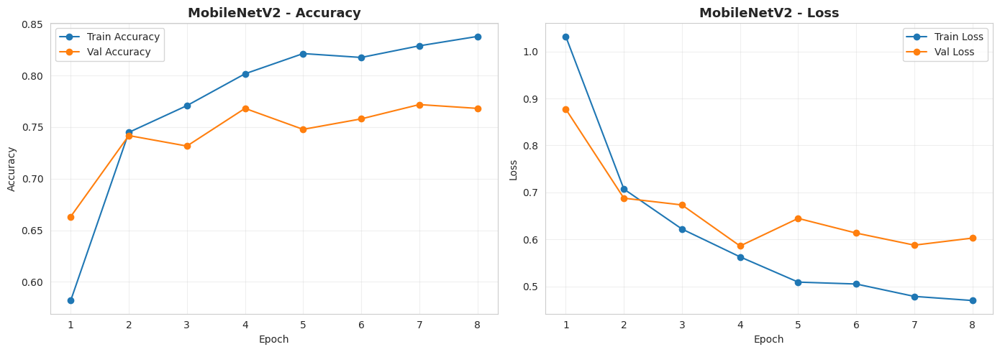

MobileNetV2 - Best Val Accuracy: 0.7681  |  Best Val Loss: 0.5859
68/68 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step

Classification Report - MobileNetV2
              precision    recall  f1-score   support

   Black Rot       0.78      0.49      0.60       566
        ESCA       0.61      0.95      0.74       576
     Healthy       0.98      0.86      0.92       507
 Leaf Blight       0.87      0.78      0.82       516

    accuracy                           0.77      2165
   macro avg       0.81      0.77      0.77      2165
weighted avg       0.80      0.77      0.76      2165



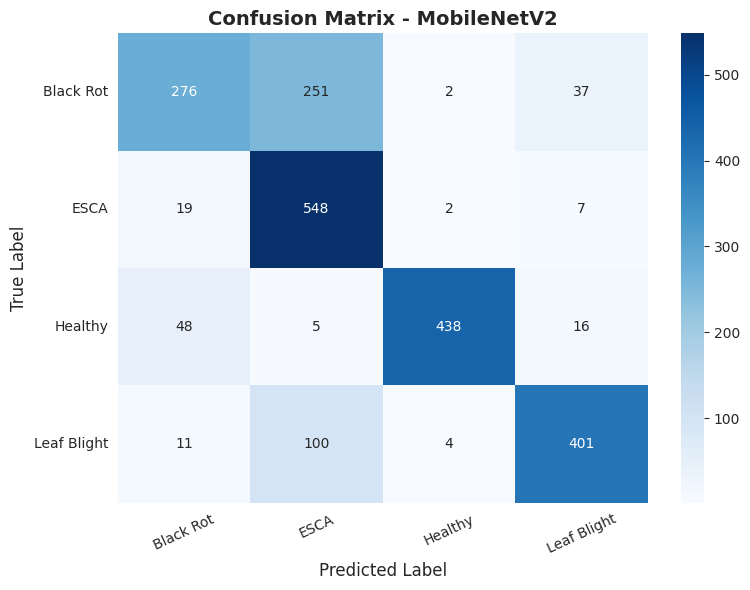

Mean confidence (correct):   0.8467
Mean confidence (incorrect): 0.6487
Number of misclassified samples: 502 / 2165


In [25]:
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# --- 1. Train/Validation accuracy & loss curves ---
def plot_training_curves(history, model_name):
    acc = history.history["accuracy"]
    val_acc = history.history["val_accuracy"]
    loss = history.history["loss"]
    val_loss = history.history["val_loss"]
    epochs_range = range(1, len(acc) + 1)

    plt.figure(figsize=(14, 5))

    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, acc, label="Train Accuracy", marker="o")
    plt.plot(epochs_range, val_acc, label="Val Accuracy", marker="o")
    plt.title(f"{model_name} - Accuracy", fontsize=13, fontweight="bold")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.legend()
    plt.grid(alpha=0.3)

    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, loss, label="Train Loss", marker="o")
    plt.plot(epochs_range, val_loss, label="Val Loss", marker="o")
    plt.title(f"{model_name} - Loss", fontsize=13, fontweight="bold")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()
    plt.grid(alpha=0.3)

    plt.tight_layout()
    plt.show()

plot_training_curves(mobilenet_history, "MobileNetV2")

# --- 2. Confusion matrix + classification report ---
def evaluate_model(model, generator, model_name):
    generator.reset()
    predictions = model.predict(generator, verbose=1)
    predicted_classes = np.argmax(predictions, axis=1)
    prediction_confidences = np.max(predictions, axis=1)
    true_classes = generator.classes
    class_labels = list(generator.class_indices.keys())

    print(f"\n{'='*60}")
    print(f"Classification Report - {model_name}")
    print(f"{'='*60}")
    print(classification_report(true_classes, predicted_classes, target_names=class_labels))

    cm = confusion_matrix(true_classes, predicted_classes)

    plt.figure(figsize=(8, 6))
    sns.heatmap(
        cm, annot=True, fmt="d", cmap="Blues",
        xticklabels=class_labels,
        yticklabels=class_labels
    )
    plt.title(f"Confusion Matrix - {model_name}", fontsize=14, fontweight="bold")
    plt.xlabel("Predicted Label", fontsize=12)
    plt.ylabel("True Label", fontsize=12)
    plt.xticks(rotation=25)
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()

    correct_mask = predicted_classes == true_classes
    print(f"Mean confidence (correct):   {prediction_confidences[correct_mask].mean():.4f}")
    if (~correct_mask).sum() > 0:
        print(f"Mean confidence (incorrect): {prediction_confidences[~correct_mask].mean():.4f}")
    print(f"Number of misclassified samples: {(~correct_mask).sum()} / {len(true_classes)}")

    return predicted_classes, true_classes

mobilenet_val_loss, mobilenet_val_acc = mobilenet_model.evaluate(val_generator, verbose=0)
print(f"MobileNetV2 - Best Val Accuracy: {mobilenet_val_acc:.4f}  |  Best Val Loss: {mobilenet_val_loss:.4f}")

mobilenet_preds, mobilenet_true = evaluate_model(mobilenet_model, val_generator, "MobileNetV2")

# **Training VGG16**

In [26]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
from itertools import cycle

## **Building VGG16 Model**

In [27]:
def build_vgg16(input_shape=(IMG_SIZE, IMG_SIZE, 3), num_classes=NUM_CLASSES):
    base_model = VGG16(
        weights="imagenet",
        include_top=False,
        input_shape=input_shape
    )
    base_model.trainable = False

    inputs = tf.keras.Input(shape=input_shape)
    x = base_model(inputs, training=False)
    x = GlobalAveragePooling2D()(x)
    x = Dense(256, activation="relu")(x)
    x = Dropout(0.5)(x)
    x = Dense(128, activation="relu")(x)
    x = Dropout(0.3)(x)
    outputs = Dense(num_classes, activation="softmax")(x)

    model = Model(inputs, outputs)
    return model, base_model

vgg16_model, vgg16_base = build_vgg16()
vgg16_model.compile(
    optimizer="adam",
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

total_params = vgg16_model.count_params()
trainable_params = sum([tf.keras.backend.count_params(w) for w in vgg16_model.trainable_weights])
print(f"Total parameters: {total_params:,}")
print(f"Trainable parameters: {trainable_params:,}")
print(f"Frozen parameters: {total_params - trainable_params:,}")

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
Total parameters: 14,879,428
Trainable parameters: 164,740
Frozen parameters: 14,714,688


In [28]:
vgg16_model.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ vgg16 (Functional)              │ (None, 7, 7, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 4)              │           516 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,879,428 (56.76 MB)

 Trainable params: 164,740 (643.52 KB)

 Non-trainable params: 14,714,688 (56.13 MB)

## **Training Model**

In [29]:
vgg16_history = vgg16_model.fit(
    train_generator,
    epochs=EPOCHS,
    validation_data=val_generator,
    verbose=1
)

Epoch 1/15
159/159 ━━━━━━━━━━━━━━━━━━━━ 127s 699ms/step - accuracy: 0.6227 - loss: 0.8672 - val_accuracy: 0.8831 - val_loss: 0.3691
Epoch 2/15
159/159 ━━━━━━━━━━━━━━━━━━━━ 94s 590ms/step - accuracy: 0.8250 - loss: 0.4166 - val_accuracy: 0.8476 - val_loss: 0.2962
Epoch 3/15
159/159 ━━━━━━━━━━━━━━━━━━━━ 94s 594ms/step - accuracy: 0.8558 - loss: 0.3433 - val_accuracy: 0.9178 - val_loss: 0.2020
Epoch 4/15
159/159 ━━━━━━━━━━━━━━━━━━━━ 95s 594ms/step - accuracy: 0.8762 - loss: 0.3083 - val_accuracy: 0.9363 - val_loss: 0.1815
Epoch 5/15
159/159 ━━━━━━━━━━━━━━━━━━━━ 94s 588ms/step - accuracy: 0.8954 - loss: 0.2603 - val_accuracy: 0.9483 - val_loss: 0.1412
Epoch 6/15
159/159 ━━━━━━━━━━━━━━━━━━━━ 92s 576ms/step - accuracy: 0.9080 - loss: 0.2331 - val_accuracy: 0.9279 - val_loss: 0.1698
Epoch 7/15
159/159 ━━━━━━━━━━━━━━━━━━━━ 90s 566ms/step - accuracy: 0.9045 - loss: 0.2357 - val_accuracy: 0.9547 - val_loss: 0.1219
Epoch 8/15
159/159 ━━━━━━━━━━━━━━━━━━━━ 90s 565ms/step - accuracy: 0.9092 - loss: 

## **Model Evaluation**

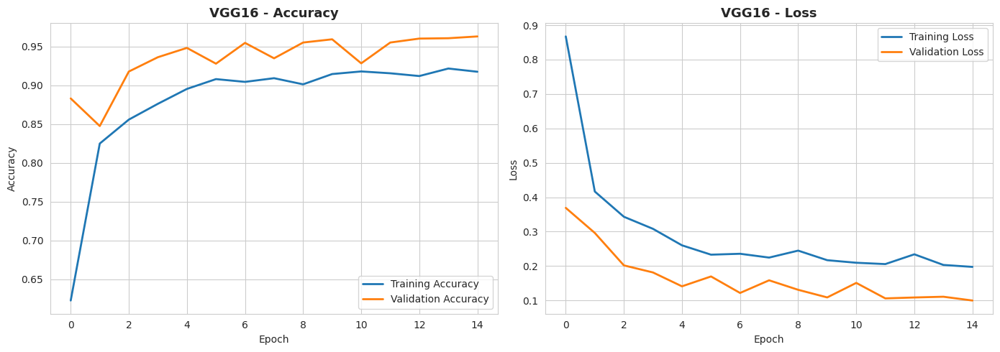

In [30]:
def plot_training_history(history, model_name):
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    axes[0].plot(history.history["accuracy"], label="Training Accuracy", linewidth=2)
    axes[0].plot(history.history["val_accuracy"], label="Validation Accuracy", linewidth=2)
    axes[0].set_title(f"{model_name} - Accuracy", fontsize=13, fontweight="bold")
    axes[0].set_xlabel("Epoch")
    axes[0].set_ylabel("Accuracy")
    axes[0].legend(fontsize=10)
    axes[0].grid(True)

    axes[1].plot(history.history["loss"], label="Training Loss", linewidth=2)
    axes[1].plot(history.history["val_loss"], label="Validation Loss", linewidth=2)
    axes[1].set_title(f"{model_name} - Loss", fontsize=13, fontweight="bold")
    axes[1].set_xlabel("Epoch")
    axes[1].set_ylabel("Loss")
    axes[1].legend(fontsize=10)
    axes[1].grid(True)

    plt.tight_layout()
    plt.show()

plot_training_history(vgg16_history, "VGG16")

68/68 ━━━━━━━━━━━━━━━━━━━━ 14s 193ms/step

Classification Report - VGG16
              precision    recall  f1-score   support

   Black Rot       0.99      0.88      0.93       566
        ESCA       0.89      0.99      0.94       576
     Healthy       1.00      1.00      1.00       507
 Leaf Blight       1.00      0.99      1.00       516

    accuracy                           0.96      2165
   macro avg       0.97      0.96      0.96      2165
weighted avg       0.97      0.96      0.96      2165



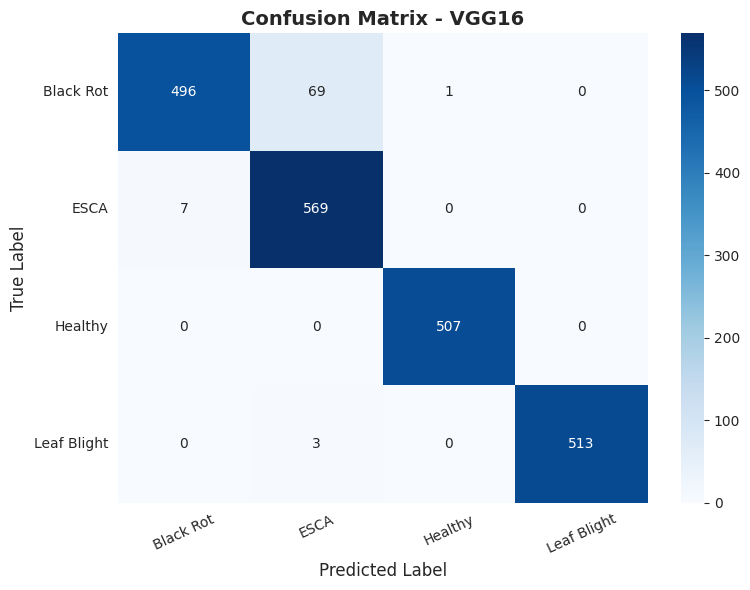

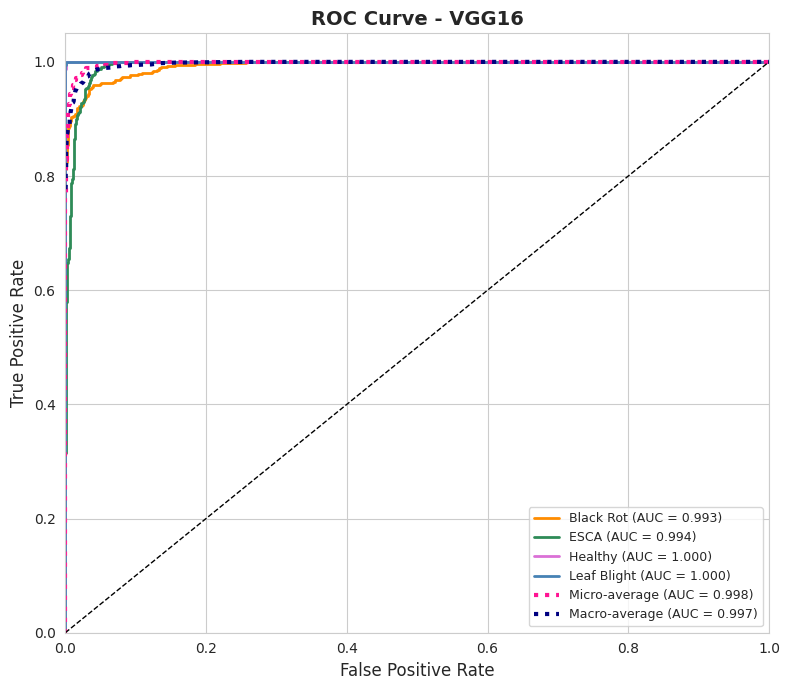

In [31]:
def evaluate_model(model, generator, model_name):
    generator.reset()
    predictions = model.predict(generator, verbose=1)
    predicted_classes = np.argmax(predictions, axis=1)
    true_classes = generator.classes
    class_labels = list(generator.class_indices.keys())
    n_classes = len(class_labels)

    print(f"\n{'='*60}")
    print(f"Classification Report - {model_name}")
    print(f"{'='*60}")
    print(classification_report(true_classes, predicted_classes, target_names=class_labels))

    cm = confusion_matrix(true_classes, predicted_classes)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=class_labels, yticklabels=class_labels)
    plt.title(f"Confusion Matrix - {model_name}", fontsize=14, fontweight="bold")
    plt.xlabel("Predicted Label", fontsize=12)
    plt.ylabel("True Label", fontsize=12)
    plt.xticks(rotation=25)
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()

    true_binarized = label_binarize(true_classes, classes=range(n_classes))
    fpr, tpr, roc_auc = {}, {}, {}
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(true_binarized[:, i], predictions[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    fpr["micro"], tpr["micro"], _ = roc_curve(true_binarized.ravel(), predictions.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))
    mean_tpr = np.zeros_like(all_fpr)
    for i in range(n_classes):
        mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
    mean_tpr /= n_classes
    fpr["macro"], tpr["macro"] = all_fpr, mean_tpr
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

    plt.figure(figsize=(8, 7))
    colors = cycle(["darkorange", "seagreen", "orchid", "steelblue", "coral", "gold"])
    for i, color in zip(range(n_classes), colors):
        plt.plot(fpr[i], tpr[i], color=color, linewidth=2,
                 label=f"{class_labels[i]} (AUC = {roc_auc[i]:.3f})")
    plt.plot(fpr["micro"], tpr["micro"], color="deeppink", linestyle=":", linewidth=3,
              label=f"Micro-average (AUC = {roc_auc['micro']:.3f})")
    plt.plot(fpr["macro"], tpr["macro"], color="navy", linestyle=":", linewidth=3,
              label=f"Macro-average (AUC = {roc_auc['macro']:.3f})")
    plt.plot([0, 1], [0, 1], "k--", linewidth=1)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel("False Positive Rate", fontsize=12)
    plt.ylabel("True Positive Rate", fontsize=12)
    plt.title(f"ROC Curve - {model_name}", fontsize=14, fontweight="bold")
    plt.legend(loc="lower right", fontsize=9)
    plt.tight_layout()
    plt.show()

    return predicted_classes, true_classes, predictions

vgg16_preds, vgg16_true, vgg16_probs = evaluate_model(vgg16_model, val_generator, "VGG16")

# **Hybrid CNN-VGG16**

In [32]:
from tensorflow.keras.layers import Concatenate

def build_hybrid_cnn_vgg16(input_shape=(IMG_SIZE, IMG_SIZE, 3), num_classes=NUM_CLASSES):
    inputs = tf.keras.Input(shape=input_shape)

    # --- Branch 1: Custom CNN (trained from scratch) ---
    x1 = Conv2D(32, (3, 3), activation="relu", padding="same")(inputs)
    x1 = BatchNormalization()(x1)
    x1 = MaxPooling2D((2, 2))(x1)

    x1 = Conv2D(64, (3, 3), activation="relu", padding="same")(x1)
    x1 = BatchNormalization()(x1)
    x1 = MaxPooling2D((2, 2))(x1)

    x1 = Conv2D(128, (3, 3), activation="relu", padding="same")(x1)
    x1 = BatchNormalization()(x1)
    x1 = MaxPooling2D((2, 2))(x1)

    x1 = GlobalAveragePooling2D()(x1)

    # --- Branch 2: Pretrained VGG16 (frozen) ---
    vgg16_base = VGG16(weights="imagenet", include_top=False, input_shape=input_shape)
    vgg16_base.trainable = False

    x2 = vgg16_base(inputs, training=False)
    x2 = GlobalAveragePooling2D()(x2)

    # --- Merge both feature sets ---
    merged = Concatenate()([x1, x2])

    x = Dense(256, activation="relu")(merged)
    x = Dropout(0.5)(x)
    x = Dense(128, activation="relu")(x)
    x = Dropout(0.3)(x)
    outputs = Dense(num_classes, activation="softmax")(x)

    model = Model(inputs, outputs, name="Hybrid_CNN_VGG16")
    return model, vgg16_base

hybrid_model, hybrid_vgg16_base = build_hybrid_cnn_vgg16()
hybrid_model.compile(
    optimizer="adam",
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

total_params = hybrid_model.count_params()
print(f"Total parameters: {total_params:,}")
hybrid_model.summary()

Total parameters: 15,006,340


Model: "Hybrid_CNN_VGG16"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_5       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 224, 224,  │        896 │ input_layer_5[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 224, 224,  │        128 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_4     │ (None, 112, 112,  │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 112, 112,  │     18,496 │ max_pooling2d_4[… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 112, 112,  │        256 │ conv2d_5[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_5     │ (None, 56, 56,    │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 56, 56,    │     73,856 │ max_pooling2d_5[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 56, 56,    │        512 │ conv2d_6[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_6     │ (None, 28, 28,    │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ vgg16 (Functional)  │ (None, 7, 7, 512) │ 14,714,688 │ input_layer_5[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 128)       │          0 │ max_pooling2d_6[… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 512)       │          0 │ vgg16[0][0]       │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 640)       │          0 │ global_average_p… │
│ (Concatenate)       │                   │            │ global_average_p… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_8 (Dense)     │ (None, 256)       │    164,096 │ concatenate[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_5 (Dropout) │ (None, 256)       │          0 │ dense_8[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_9 (Dense)     │ (None, 128)       │     32,896 │ dropout_5[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_6 (Dropout) │ (None, 128)       │          0 │ dense_9[0][0]     │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 15,006,340 (57.24 MB)

 Trainable params: 291,204 (1.11 MB)

 Non-trainable params: 14,715,136 (56.13 MB)

In [33]:
hybrid_callbacks = [
    EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True),
    ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=2, min_lr=1e-6)
]

hybrid_history = hybrid_model.fit(
    train_generator,
    epochs=EPOCHS,
    validation_data=val_generator,
    callbacks=hybrid_callbacks,
    verbose=1
)

Epoch 1/15
159/159 ━━━━━━━━━━━━━━━━━━━━ 115s 672ms/step - accuracy: 0.7890 - loss: 0.5328 - val_accuracy: 0.4614 - val_loss: 3.7583 - learning_rate: 0.0010
Epoch 2/15
159/159 ━━━━━━━━━━━━━━━━━━━━ 103s 643ms/step - accuracy: 0.8901 - loss: 0.2907 - val_accuracy: 0.4864 - val_loss: 2.0376 - learning_rate: 0.0010
Epoch 3/15
159/159 ━━━━━━━━━━━━━━━━━━━━ 102s 639ms/step - accuracy: 0.9193 - loss: 0.2180 - val_accuracy: 0.2998 - val_loss: 4.3442 - learning_rate: 0.0010
Epoch 4/15
159/159 ━━━━━━━━━━━━━━━━━━━━ 103s 648ms/step - accuracy: 0.9417 - loss: 0.1609 - val_accuracy: 0.8693 - val_loss: 0.4540 - learning_rate: 0.0010
Epoch 5/15
159/159 ━━━━━━━━━━━━━━━━━━━━ 101s 634ms/step - accuracy: 0.9519 - loss: 0.1324 - val_accuracy: 0.9566 - val_loss: 0.1150 - learning_rate: 0.0010
Epoch 6/15
159/159 ━━━━━━━━━━━━━━━━━━━━ 99s 625ms/step - accuracy: 0.9648 - loss: 0.1055 - val_accuracy: 0.9404 - val_loss: 0.1380 - learning_rate: 0.0010
Epoch 7/15
159/159 ━━━━━━━━━━━━━━━━━━━━ 99s 623ms/step - accuracy

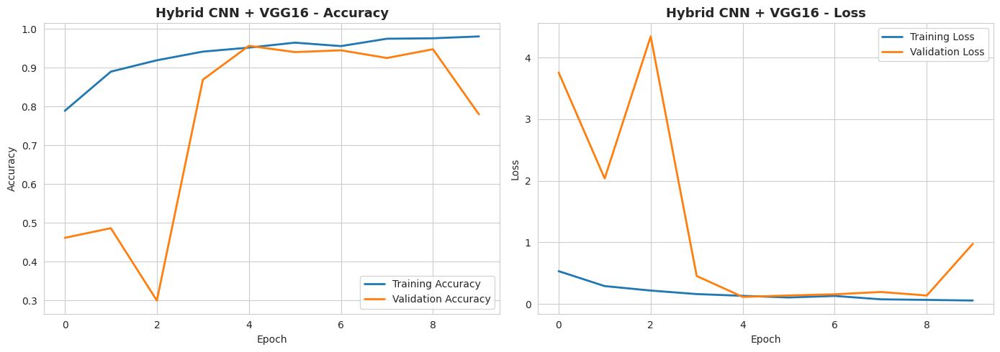

68/68 ━━━━━━━━━━━━━━━━━━━━ 15s 200ms/step

Classification Report - Hybrid CNN + VGG16
              precision    recall  f1-score   support

   Black Rot       0.98      0.87      0.92       566
        ESCA       0.94      0.97      0.95       576
     Healthy       0.94      1.00      0.97       507
 Leaf Blight       0.98      1.00      0.99       516

    accuracy                           0.96      2165
   macro avg       0.96      0.96      0.96      2165
weighted avg       0.96      0.96      0.96      2165



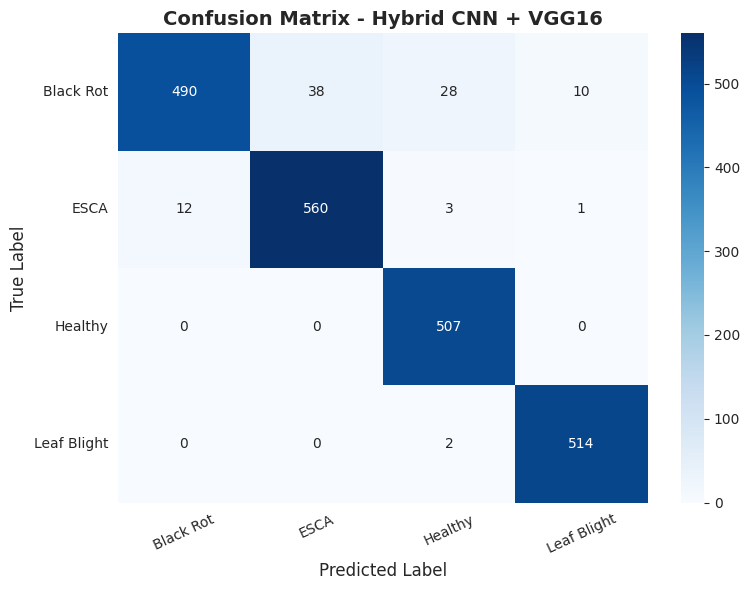

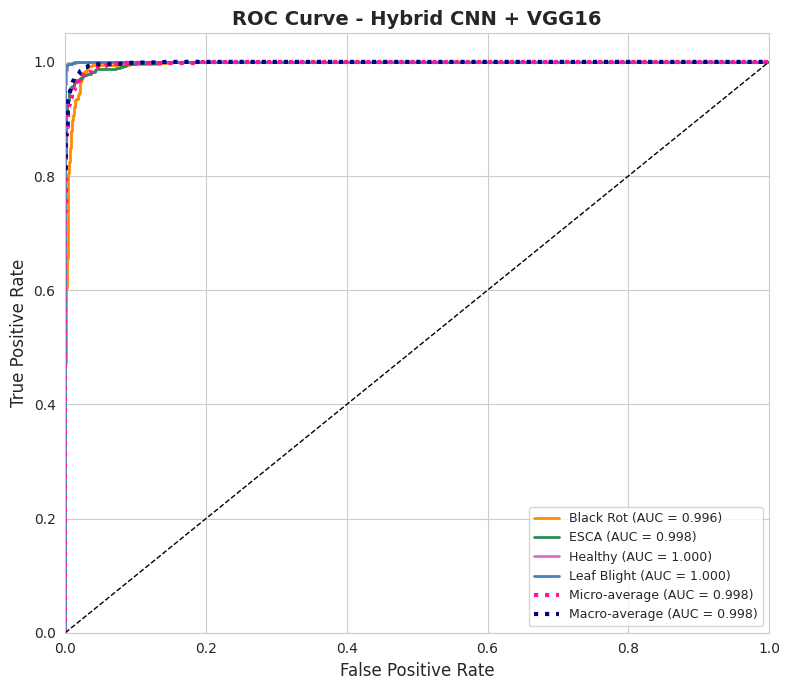

(array([0, 0, 0, ..., 3, 3, 3]),
 array([0, 0, 0, ..., 3, 3, 3], dtype=int32),
 array([[9.6996415e-01, 5.5340747e-03, 3.5170231e-03, 2.0984663e-02],
        [7.0583886e-01, 2.6748183e-01, 1.5544501e-02, 1.1134902e-02],
        [6.8841451e-01, 2.7575448e-01, 3.1406939e-02, 4.4241217e-03],
        ...,
        [1.3845906e-06, 1.5874892e-06, 3.4843356e-07, 9.9999666e-01],
        [1.7064236e-05, 4.6658257e-05, 1.6091280e-05, 9.9992025e-01],
        [2.4717898e-05, 4.9862050e-05, 1.7306533e-05, 9.9990809e-01]],
       dtype=float32))

In [34]:
plot_training_history(hybrid_history, "Hybrid CNN + VGG16")
evaluate_model(hybrid_model, val_generator, "Hybrid CNN + VGG16")

# **Explainable AI**

VGG16 branch: vgg16  |  Last conv layer: block5_conv3


/tmp/ipykernel_1214/2734794786.py:108: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  jet = cm.get_cmap("jet")


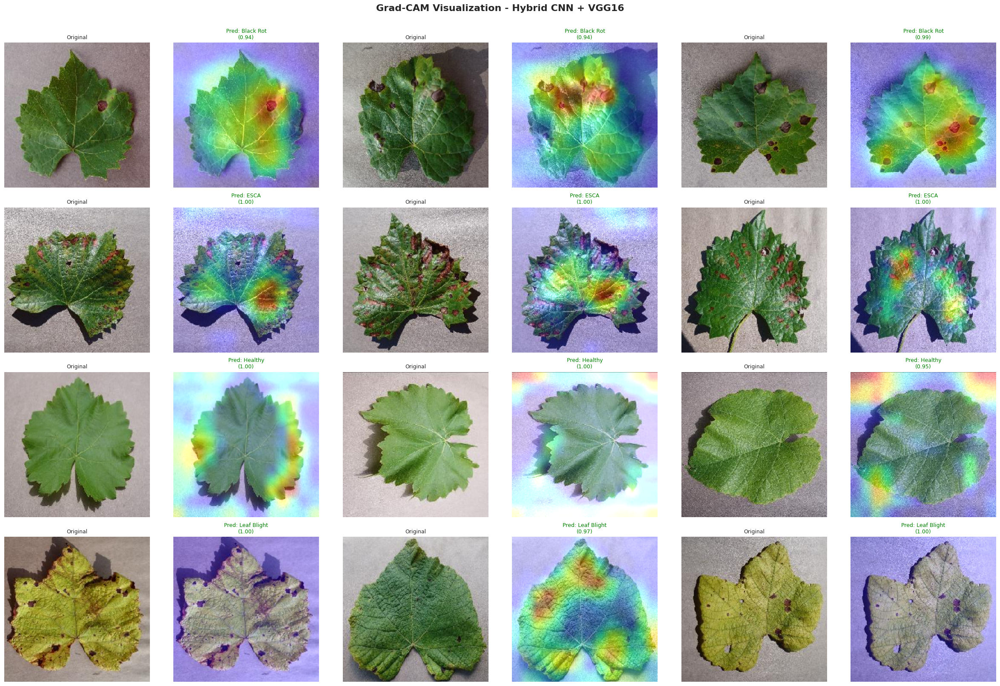

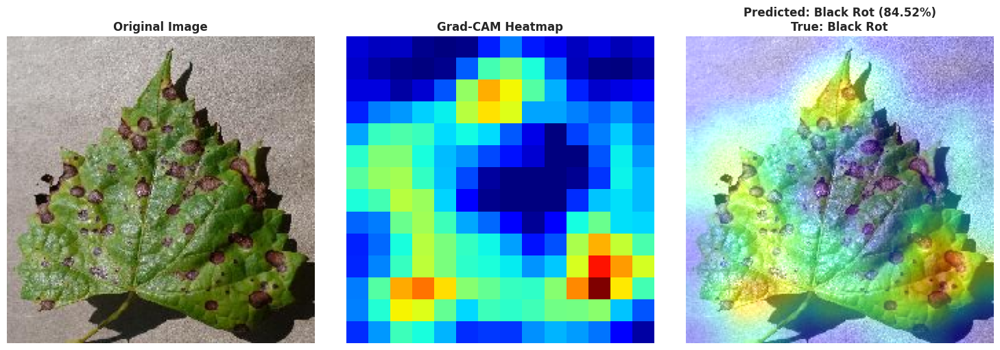

In [35]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import matplotlib.cm as cm

def find_vgg_branch(model):
    for layer in model.layers:
        if isinstance(layer, tf.keras.Model):
            if any(l.name.startswith("block5") for l in layer.layers):
                return layer
    raise ValueError("Could not find the VGG16 branch inside the hybrid model.")


def find_last_conv_layer(sub_model):
    for layer in reversed(sub_model.layers):
        if isinstance(layer, tf.keras.layers.Conv2D):
            return layer.name
    raise ValueError("No Conv2D layer found in this sub-model.")


vgg_branch = find_vgg_branch(hybrid_model)
last_conv_layer_name = find_last_conv_layer(vgg_branch)
print(f"VGG16 branch: {vgg_branch.name}  |  Last conv layer: {last_conv_layer_name}")


def preprocess_for_hybrid(img_path, img_size=(IMG_SIZE, IMG_SIZE)):
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=img_size)
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = img_array / 255.0
    return np.expand_dims(img_array, axis=0)


def build_gradcam_components(hybrid_model, vgg_branch, last_conv_layer_name):
    vgg_grad_model = tf.keras.Model(
        vgg_branch.input,
        [vgg_branch.get_layer(last_conv_layer_name).output, vgg_branch.output]
    )

    gap_layers = [l for l in hybrid_model.layers if isinstance(l, tf.keras.layers.GlobalAveragePooling2D)]
    if len(gap_layers) != 2:
        raise ValueError(f"Expected 2 GlobalAveragePooling2D layers, found {len(gap_layers)}.")
    cnn_gap_layer, vgg_gap_layer = gap_layers[0], gap_layers[1]

    cnn_branch_model = tf.keras.Model(hybrid_model.input, cnn_gap_layer.output)

    concat_layer = next(l for l in hybrid_model.layers if isinstance(l, tf.keras.layers.Concatenate))
    head_layers = []
    started = False
    for layer in hybrid_model.layers:
        if layer is concat_layer:
            started = True
            continue
        if started:
            head_layers.append(layer)

    return {
        "vgg_grad_model": vgg_grad_model,
        "cnn_branch_model": cnn_branch_model,
        "vgg_gap_layer": vgg_gap_layer,
        "concat_layer": concat_layer,
        "head_layers": head_layers,
    }


gradcam_components = build_gradcam_components(hybrid_model, vgg_branch, last_conv_layer_name)


def make_gradcam_heatmap(img_array, gradcam_components, pred_index=None):
    vgg_grad_model = gradcam_components["vgg_grad_model"]
    cnn_branch_model = gradcam_components["cnn_branch_model"]
    vgg_gap_layer = gradcam_components["vgg_gap_layer"]
    concat_layer = gradcam_components["concat_layer"]
    head_layers = gradcam_components["head_layers"]

    x1 = cnn_branch_model(img_array, training=False)

    with tf.GradientTape() as tape:
        conv_output, vgg_conv_out = vgg_grad_model(img_array, training=False)
        tape.watch(conv_output)

        x2 = vgg_gap_layer(vgg_conv_out)
        merged = concat_layer([x1, x2])

        x = merged
        for layer in head_layers:
            x = layer(x, training=False)
        predictions = x

        if pred_index is None:
            pred_index = tf.argmax(predictions[0])
        class_channel = predictions[:, pred_index]

    grads = tape.gradient(class_channel, conv_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_output = conv_output[0]
    heatmap = conv_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / (tf.math.reduce_max(heatmap) + 1e-8)
    return heatmap.numpy(), int(pred_index)


def overlay_gradcam(img_path, heatmap, alpha=0.4, img_size=(IMG_SIZE, IMG_SIZE)):
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=img_size)
    img = tf.keras.preprocessing.image.img_to_array(img)

    heatmap_resized = np.uint8(255 * heatmap)
    jet = cm.get_cmap("jet")
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap_resized]

    jet_heatmap = tf.keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = tf.keras.preprocessing.image.img_to_array(jet_heatmap)

    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = np.clip(superimposed_img, 0, 255).astype("uint8")

    return img.astype("uint8"), superimposed_img


class_labels = list(val_generator.class_indices.keys())
n_samples_per_class = 3

fig, axes = plt.subplots(len(class_labels), n_samples_per_class * 2,
                          figsize=(4 * n_samples_per_class * 2, 4 * len(class_labels)))

for row, cls in enumerate(class_labels):
    cls_df = df[df["label"] == cls].sample(n_samples_per_class, random_state=42)

    for col, img_path in enumerate(cls_df["filepath"]):
        img_array = preprocess_for_hybrid(img_path)

        preds = hybrid_model.predict(img_array, verbose=0)
        pred_class_idx = np.argmax(preds[0])
        pred_class_name = class_labels[pred_class_idx]
        confidence = preds[0][pred_class_idx]

        heatmap, _ = make_gradcam_heatmap(img_array, gradcam_components, pred_class_idx)
        orig_img, overlay_img = overlay_gradcam(img_path, heatmap)

        ax_orig = axes[row, col * 2]
        ax_orig.imshow(orig_img)
        ax_orig.axis("off")
        if col == 0:
            ax_orig.set_ylabel(cls, fontsize=12, fontweight="bold")
        ax_orig.set_title("Original", fontsize=9)

        ax_cam = axes[row, col * 2 + 1]
        ax_cam.imshow(overlay_img)
        ax_cam.axis("off")
        color = "green" if pred_class_name == cls else "red"
        ax_cam.set_title(f"Pred: {pred_class_name}\n({confidence:.2f})", fontsize=9, color=color)

plt.suptitle("Grad-CAM Visualization - Hybrid CNN + VGG16", fontsize=16, fontweight="bold", y=1.005)
plt.tight_layout()
plt.show()


def show_gradcam_single(img_path, gradcam_components, true_label=None):
    img_array = preprocess_for_hybrid(img_path)

    preds = hybrid_model.predict(img_array, verbose=0)
    pred_class_idx = np.argmax(preds[0])
    class_labels = list(val_generator.class_indices.keys())
    pred_class_name = class_labels[pred_class_idx]
    confidence = preds[0][pred_class_idx]

    heatmap, _ = make_gradcam_heatmap(img_array, gradcam_components, pred_class_idx)
    orig_img, overlay_img = overlay_gradcam(img_path, heatmap)

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(orig_img)
    axes[0].set_title("Original Image", fontsize=12, fontweight="bold")
    axes[0].axis("off")

    axes[1].imshow(heatmap, cmap="jet")
    axes[1].set_title("Grad-CAM Heatmap", fontsize=12, fontweight="bold")
    axes[1].axis("off")

    axes[2].imshow(overlay_img)
    title = f"Predicted: {pred_class_name} ({confidence:.2%})"
    if true_label:
        title += f"\nTrue: {true_label}"
    axes[2].set_title(title, fontsize=12, fontweight="bold")
    axes[2].axis("off")

    plt.tight_layout()
    plt.show()


sample_path = df[df["label"] == class_labels[0]]["filepath"].iloc[0]
show_gradcam_single(sample_path, gradcam_components, true_label=class_labels[0])

# **SteamLit App**

In [36]:
import os
import json
import tensorflow as tf

SAVE_DIR = "saved_models"
os.makedirs(SAVE_DIR, exist_ok=True)

In [37]:
cnn_model.save(os.path.join(SAVE_DIR, "cnn_model.keras"))
print("Saved: cnn_model.keras")

Saved: cnn_model.keras


In [38]:
mobilenet_model.save(os.path.join(SAVE_DIR, "mobilenet_model.keras"))
print("Saved: mobilenet_model.keras")

Saved: mobilenet_model.keras


In [39]:
vgg16_model.save(os.path.join(SAVE_DIR, "vgg16_model.keras"))
print("Saved: vgg16_model.keras")

Saved: vgg16_model.keras


In [40]:
hybrid_model.save(os.path.join(SAVE_DIR, "hybrid_model.keras"))
print("Saved: hybrid_model.keras")

Saved: hybrid_model.keras


In [41]:
class_indices = train_generator.class_indices
idx_to_class = {v: k for k, v in class_indices.items()}

config = {
    "img_size": IMG_SIZE,
    "class_indices": class_indices,
    "idx_to_class": idx_to_class,
}

with open(os.path.join(SAVE_DIR, "app_config.json"), "w") as f:
    json.dump(config, f, indent=2)

print(config)

{'img_size': 224, 'class_indices': {'Black Rot': 0, 'ESCA': 1, 'Healthy': 2, 'Leaf Blight': 3}, 'idx_to_class': {0: 'Black Rot', 1: 'ESCA', 2: 'Healthy', 3: 'Leaf Blight'}}


In [42]:
import shutil
from google.colab import files

shutil.make_archive("saved_models", "zip", SAVE_DIR)
files.download("saved_models.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [43]:
!pip install -q streamlit pyngrok

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.4/10.4 MB 69.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.4/11.4 MB 60.2 MB/s eta 0:00:00


In [44]:
import os

os.makedirs("saved_models", exist_ok=True)
print(os.listdir("saved_models"))

['hybrid_model.keras', 'vgg16_model.keras', 'mobilenet_model.keras', 'app_config.json', 'cnn_model.keras']


In [45]:
%%writefile app.py
import os
import json
import numpy as np
import streamlit as st
import tensorflow as tf
from PIL import Image
import matplotlib.cm as cm

st.set_page_config(page_title="Grape Disease Classifier", layout="wide")

SAVE_DIR = "saved_models"


@st.cache_resource
def load_config():
    with open(os.path.join(SAVE_DIR, "app_config.json")) as f:
        config = json.load(f)
    config["idx_to_class"] = {int(k): v for k, v in config["idx_to_class"].items()}
    return config


@st.cache_resource
def load_models():
    return {
        "Baseline CNN": tf.keras.models.load_model(os.path.join(SAVE_DIR, "cnn_model.keras")),
        "MobileNetV2": tf.keras.models.load_model(os.path.join(SAVE_DIR, "mobilenet_model.keras")),
        "VGG16": tf.keras.models.load_model(os.path.join(SAVE_DIR, "vgg16_model.keras")),
        "Hybrid CNN + VGG16": tf.keras.models.load_model(os.path.join(SAVE_DIR, "hybrid_model.keras")),
    }


config = load_config()
IMG_SIZE = config["img_size"]
IDX_TO_CLASS = config["idx_to_class"]
models = load_models()


def preprocess_image(pil_img):
    img = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.array(img).astype("float32") / 255.0
    return np.expand_dims(arr, axis=0)


def predict(model, img_array):
    preds = model.predict(img_array, verbose=0)[0]
    pred_idx = int(np.argmax(preds))
    return IDX_TO_CLASS[pred_idx], float(preds[pred_idx]), preds


def find_last_conv_layer(sub_model):
    for layer in reversed(sub_model.layers):
        if isinstance(layer, tf.keras.layers.Conv2D):
            return layer.name
    return None


def find_nested_base(model):
    for layer in model.layers:
        if isinstance(layer, tf.keras.Model):
            if find_last_conv_layer(layer) is not None:
                return layer
    return None


def has_concatenate(model):
    return any(isinstance(l, tf.keras.layers.Concatenate) for l in model.layers)


@st.cache_resource
def build_gradcam_single_branch(_model):
    nested = find_nested_base(_model)
    top_layers = _model.layers

    if nested is None:
        last_conv = find_last_conv_layer(_model)
        if last_conv is None:
            return None
        grad_model = tf.keras.Model(_model.input, [_model.get_layer(last_conv).output, _model.output])
        return {"mode": "flat", "grad_model": grad_model}

    last_conv = find_last_conv_layer(nested)
    idx = top_layers.index(nested)
    pre_layers = top_layers[1:idx]
    post_layers = top_layers[idx + 1:]
    nested_grad_model = tf.keras.Model(nested.input, [nested.get_layer(last_conv).output, nested.output])
    return {
        "mode": "nested",
        "pre_layers": pre_layers,
        "nested_grad_model": nested_grad_model,
        "post_layers": post_layers,
    }


@st.cache_resource
def build_gradcam_hybrid(_model):
    nested = find_nested_base(_model)
    last_conv = find_last_conv_layer(nested)

    vgg_grad_model = tf.keras.Model(
        nested.input,
        [nested.get_layer(last_conv).output, nested.output]
    )

    gap_layers = [l for l in _model.layers if isinstance(l, tf.keras.layers.GlobalAveragePooling2D)]
    cnn_gap_layer, vgg_gap_layer = gap_layers[0], gap_layers[1]
    cnn_branch_model = tf.keras.Model(_model.input, cnn_gap_layer.output)

    concat_layer = next(l for l in _model.layers if isinstance(l, tf.keras.layers.Concatenate))
    head_layers = []
    started = False
    for layer in _model.layers:
        if layer is concat_layer:
            started = True
            continue
        if started:
            head_layers.append(layer)

    return {
        "vgg_grad_model": vgg_grad_model,
        "cnn_branch_model": cnn_branch_model,
        "vgg_gap_layer": vgg_gap_layer,
        "concat_layer": concat_layer,
        "head_layers": head_layers,
    }


def gradcam_single_branch(img_array, components, pred_index):
    if components["mode"] == "flat":
        grad_model = components["grad_model"]
        with tf.GradientTape() as tape:
            conv_output, predictions = grad_model(img_array)
            tape.watch(conv_output)
            class_channel = predictions[:, pred_index]
        grads = tape.gradient(class_channel, conv_output)
    else:
        x = img_array
        for layer in components["pre_layers"]:
            x = layer(x)
        pre_output = x

        with tf.GradientTape() as tape:
            conv_output, base_output = components["nested_grad_model"](pre_output)
            tape.watch(conv_output)
            y = base_output
            for layer in components["post_layers"]:
                y = layer(y, training=False)
            predictions = y
            class_channel = predictions[:, pred_index]
        grads = tape.gradient(class_channel, conv_output)

    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_output = conv_output[0]
    heatmap = conv_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / (tf.math.reduce_max(heatmap) + 1e-8)
    return heatmap.numpy()


def gradcam_hybrid(img_array, components, pred_index):
    x1 = components["cnn_branch_model"](img_array, training=False)

    with tf.GradientTape() as tape:
        conv_output, vgg_conv_out = components["vgg_grad_model"](img_array, training=False)
        tape.watch(conv_output)
        x2 = components["vgg_gap_layer"](vgg_conv_out)
        merged = components["concat_layer"]([x1, x2])
        x = merged
        for layer in components["head_layers"]:
            x = layer(x, training=False)
        predictions = x
        class_channel = predictions[:, pred_index]

    grads = tape.gradient(class_channel, conv_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_output = conv_output[0]
    heatmap = conv_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / (tf.math.reduce_max(heatmap) + 1e-8)
    return heatmap.numpy()


def compute_gradcam(model, img_array, pred_index):
    if has_concatenate(model):
        components = build_gradcam_hybrid(model)
        return gradcam_hybrid(img_array, components, pred_index)
    components = build_gradcam_single_branch(model)
    if components is None:
        return None
    return gradcam_single_branch(img_array, components, pred_index)


def overlay_heatmap(pil_img, heatmap, alpha=0.4):
    img_size = (IMG_SIZE, IMG_SIZE)
    img = pil_img.convert("RGB").resize(img_size)
    img_arr = np.array(img).astype("float32")

    heatmap_uint8 = np.uint8(255 * heatmap)
    jet = cm.get_cmap("jet")
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap_uint8]
    jet_heatmap = Image.fromarray(np.uint8(jet_heatmap * 255)).resize(img_size)
    jet_heatmap = np.array(jet_heatmap).astype("float32")

    superimposed = jet_heatmap * alpha + img_arr
    return np.clip(superimposed, 0, 255).astype("uint8")


st.title("Grape Disease Classifier")
st.write("Upload a grape leaf image to classify it as Black Rot, ESCA, Leaf Blight, or Healthy.")

model_choice = st.sidebar.selectbox("Model", list(models.keys()) + ["Compare All"])
show_gradcam = st.sidebar.checkbox("Show Grad-CAM", value=True)

uploaded_file = st.file_uploader("Upload a leaf image", type=["jpg", "jpeg", "png"])

if uploaded_file is not None:
    pil_img = Image.open(uploaded_file)
    img_array = preprocess_image(pil_img)

    st.image(pil_img, caption="Uploaded Image", width=300)

    if model_choice != "Compare All":
        model = models[model_choice]
        label, confidence, all_probs = predict(model, img_array)

        st.subheader(f"{model_choice} Prediction")
        st.metric("Predicted Class", label, f"{confidence:.2%} confidence")

        probs_dict = {IDX_TO_CLASS[i]: float(p) for i, p in enumerate(all_probs)}
        st.bar_chart(probs_dict)

        if show_gradcam:
            pred_idx = int(np.argmax(all_probs))
            heatmap = compute_gradcam(model, img_array, pred_idx)
            if heatmap is not None:
                overlay = overlay_heatmap(pil_img, heatmap)
                col1, col2 = st.columns(2)
                with col1:
                    st.image(np.uint8(255 * heatmap), caption="Grad-CAM Heatmap", clamp=True)
                with col2:
                    st.image(overlay, caption="Grad-CAM Overlay")
            else:
                st.info("Grad-CAM is not available for this model.")

    else:
        cols = st.columns(len(models))
        for col, (name, model) in zip(cols, models.items()):
            label, confidence, all_probs = predict(model, img_array)
            with col:
                st.subheader(name)
                st.write(f"**{label}**")
                st.write(f"{confidence:.2%} confidence")
                if show_gradcam:
                    pred_idx = int(np.argmax(all_probs))
                    heatmap = compute_gradcam(model, img_array, pred_idx)
                    if heatmap is not None:
                        overlay = overlay_heatmap(pil_img, heatmap)
                        st.image(overlay, caption="Grad-CAM")

Writing app.py


In [ ]:
!wget -q https://github.com/cloudflare/cloudflared/releases/latest/download/cloudflared-linux-amd64 -O cloudflared
!chmod +x cloudflared

In [46]:
import subprocess

streamlit_process = subprocess.Popen(
    ["streamlit", "run", "app.py", "--server.port", "8501", "--server.headless", "true"]
)
print("Streamlit starting...")

Streamlit starting...


In [48]:
import subprocess
import time
import re

time.sleep(5)  # give Streamlit a moment to start

cloudflared_process = subprocess.Popen(
    ["./cloudflared", "tunnel", "--url", "http://localhost:8501"],
    stdout=subprocess.PIPE,
    stderr=subprocess.STDOUT,
    text=True,
)

url = None
for line in cloudflared_process.stdout:
    print(line, end="")
    match = re.search(r"https://[a-zA-Z0-9-]+\.trycloudflare\.com", line)
    if match:
        url = match.group(0)
        print(f"\nYour Streamlit app is live at: {url}")
        break

FileNotFoundError: [Errno 2] No such file or directory: './cloudflared'

# **EfficientNetB0 training and Evaluation**

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Total parameters: 4,378,535
Trainable parameters: 328,964
Frozen parameters: 4,049,571


Model: "EfficientNetB0"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_8 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling_3 (Rescaling)         │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_4      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 256)            │       327,936 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 4)              │         1,028 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,378,535 (16.70 MB)

 Trainable params: 328,964 (1.25 MB)

 Non-trainable params: 4,049,571 (15.45 MB)

Epoch 1/15
159/159 ━━━━━━━━━━━━━━━━━━━━ 135s 681ms/step - accuracy: 0.8367 - loss: 0.5751 - val_accuracy: 0.9695 - val_loss: 0.2531 - learning_rate: 1.0000e-04
Epoch 2/15
159/159 ━━━━━━━━━━━━━━━━━━━━ 77s 482ms/step - accuracy: 0.9401 - loss: 0.2444 - val_accuracy: 0.9755 - val_loss: 0.1709 - learning_rate: 1.0000e-04
Epoch 3/15
159/159 ━━━━━━━━━━━━━━━━━━━━ 76s 475ms/step - accuracy: 0.9555 - loss: 0.1871 - val_accuracy: 0.9801 - val_loss: 0.1340 - learning_rate: 1.0000e-04
Epoch 4/15
159/159 ━━━━━━━━━━━━━━━━━━━━ 74s 468ms/step - accuracy: 0.9658 - loss: 0.1576 - val_accuracy: 0.9824 - val_loss: 0.1181 - learning_rate: 1.0000e-04
Epoch 5/15
159/159 ━━━━━━━━━━━━━━━━━━━━ 75s 470ms/step - accuracy: 0.9652 - loss: 0.1440 - val_accuracy: 0.9843 - val_loss: 0.1076 - learning_rate: 1.0000e-04
Epoch 6/15
159/159 ━━━━━━━━━━━━━━━━━━━━ 75s 475ms/step - accuracy: 0.9686 - loss: 0.1335 - val_accuracy: 0.9875 - val_loss: 0.0993 - learning_rate: 1.0000e-04
Epoch 7/15
159/159 ━━━━━━━━━━━━━━━━━━━━ 76s 4

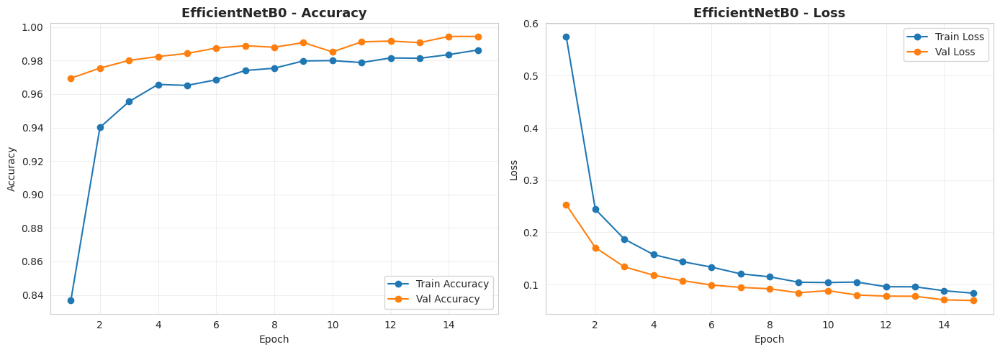

EfficientNetB0 - Best Val Accuracy: 0.9945  |  Best Val Loss: 0.0696
68/68 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step

Classification Report - EfficientNetB0
              precision    recall  f1-score   support

   Black Rot       0.99      0.99      0.99       566
        ESCA       0.99      0.99      0.99       576
     Healthy       1.00      1.00      1.00       507
 Leaf Blight       1.00      1.00      1.00       516

    accuracy                           0.99      2165
   macro avg       0.99      0.99      0.99      2165
weighted avg       0.99      0.99      0.99      2165



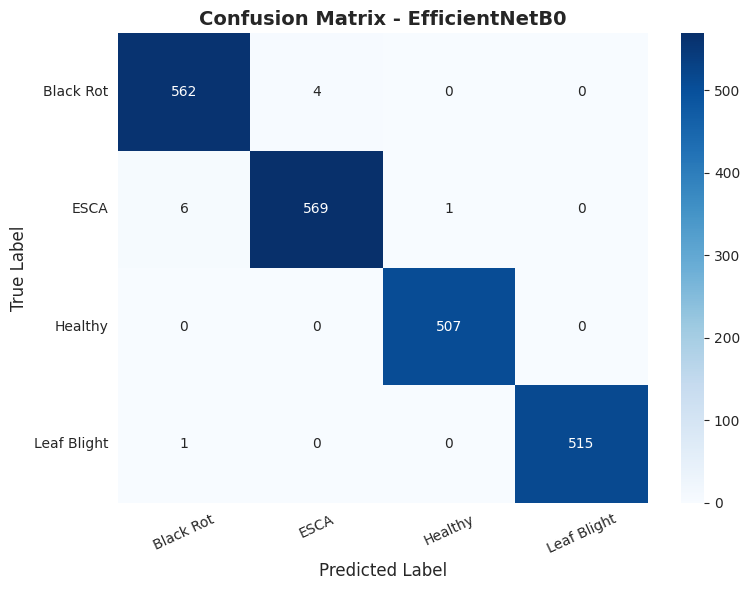

Mean confidence (correct):   0.9788
Mean confidence (incorrect): 0.6892
Number of misclassified samples: 12 / 2165


In [49]:
# ============================================================
# Training and Evaluating EfficientNetB0
# ============================================================
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# --- Build the EfficientNetB0 transfer learning model ---
def build_efficientnetb0(input_shape=(IMG_SIZE, IMG_SIZE, 3), num_classes=NUM_CLASSES):
    base_model = EfficientNetB0(
        weights="imagenet",
        include_top=False,
        input_shape=input_shape
    )
    base_model.trainable = False

    inputs = tf.keras.Input(shape=input_shape)

    # EfficientNet has its own internal preprocessing (Rescaling +
    # Normalization) and expects raw [0, 255] pixel values. Our generators
    # scale to [0, 1] via rescale=1./255, so undo that here.
    x = tf.keras.layers.Rescaling(255.0)(inputs)

    x = base_model(x, training=False)
    x = GlobalAveragePooling2D()(x)
    x = Dense(256, activation="relu", kernel_regularizer=tf.keras.regularizers.l2(1e-4))(x)
    x = Dropout(0.3)(x)
    outputs = Dense(num_classes, activation="softmax")(x)

    model = Model(inputs, outputs, name="EfficientNetB0")
    return model, base_model

efficientnet_model, efficientnet_base = build_efficientnetb0()
efficientnet_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

total_params = efficientnet_model.count_params()
trainable_params = sum([tf.keras.backend.count_params(w) for w in efficientnet_model.trainable_weights])
print(f"Total parameters: {total_params:,}")
print(f"Trainable parameters: {trainable_params:,}")
print(f"Frozen parameters: {total_params - trainable_params:,}")

efficientnet_model.summary()

# --- Train ---
efficientnet_callbacks = [
    EarlyStopping(monitor="val_loss", patience=4, restore_best_weights=True),
    ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=2, min_lr=1e-6)
]

efficientnet_history = efficientnet_model.fit(
    train_generator,
    epochs=EPOCHS,
    validation_data=val_generator,
    callbacks=efficientnet_callbacks,
    verbose=1
)

final_train_acc = efficientnet_history.history["accuracy"][-1]
final_val_acc = efficientnet_history.history["val_accuracy"][-1]
print(f"EfficientNetB0 Final Train Accuracy: {final_train_acc:.4f}  |  Final Val Accuracy: {final_val_acc:.4f}")

# --- Plot training curves ---
def plot_training_curves(history, model_name):
    acc = history.history["accuracy"]
    val_acc = history.history["val_accuracy"]
    loss = history.history["loss"]
    val_loss = history.history["val_loss"]
    epochs_range = range(1, len(acc) + 1)

    plt.figure(figsize=(14, 5))

    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, acc, label="Train Accuracy", marker="o")
    plt.plot(epochs_range, val_acc, label="Val Accuracy", marker="o")
    plt.title(f"{model_name} - Accuracy", fontsize=13, fontweight="bold")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.legend()
    plt.grid(alpha=0.3)

    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, loss, label="Train Loss", marker="o")
    plt.plot(epochs_range, val_loss, label="Val Loss", marker="o")
    plt.title(f"{model_name} - Loss", fontsize=13, fontweight="bold")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()
    plt.grid(alpha=0.3)

    plt.tight_layout()
    plt.show()

plot_training_curves(efficientnet_history, "EfficientNetB0")

# --- Confusion matrix + classification report ---
def evaluate_model(model, generator, model_name):
    generator.reset()
    predictions = model.predict(generator, verbose=1)
    predicted_classes = np.argmax(predictions, axis=1)
    prediction_confidences = np.max(predictions, axis=1)
    true_classes = generator.classes
    class_labels = list(generator.class_indices.keys())

    print(f"\n{'='*60}")
    print(f"Classification Report - {model_name}")
    print(f"{'='*60}")
    print(classification_report(true_classes, predicted_classes, target_names=class_labels))

    cm = confusion_matrix(true_classes, predicted_classes)

    plt.figure(figsize=(8, 6))
    sns.heatmap(
        cm, annot=True, fmt="d", cmap="Blues",
        xticklabels=class_labels,
        yticklabels=class_labels
    )
    plt.title(f"Confusion Matrix - {model_name}", fontsize=14, fontweight="bold")
    plt.xlabel("Predicted Label", fontsize=12)
    plt.ylabel("True Label", fontsize=12)
    plt.xticks(rotation=25)
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()

    correct_mask = predicted_classes == true_classes
    print(f"Mean confidence (correct):   {prediction_confidences[correct_mask].mean():.4f}")
    if (~correct_mask).sum() > 0:
        print(f"Mean confidence (incorrect): {prediction_confidences[~correct_mask].mean():.4f}")
    print(f"Number of misclassified samples: {(~correct_mask).sum()} / {len(true_classes)}")

    return predicted_classes, true_classes

efficientnet_val_loss, efficientnet_val_acc = efficientnet_model.evaluate(val_generator, verbose=0)
print(f"EfficientNetB0 - Best Val Accuracy: {efficientnet_val_acc:.4f}  |  Best Val Loss: {efficientnet_val_loss:.4f}")

efficientnet_preds, efficientnet_true = evaluate_model(efficientnet_model, val_generator, "EfficientNetB0")

# **Resnet 50 Training and Evaluation**

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
Total parameters: 24,113,284
Trainable parameters: 525,572
Frozen parameters: 23,587,712


Model: "ResNet50"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_10      │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_4         │ (None, 224, 224,  │          0 │ input_layer_10[0… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item (GetItem)  │ (None, 224, 224)  │          0 │ rescaling_4[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_1          │ (None, 224, 224)  │          0 │ rescaling_4[0][0] │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_2          │ (None, 224, 224)  │          0 │ rescaling_4[0][0] │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stack (Stack)       │ (None, 224, 224,  │          0 │ get_item[0][0],   │
│                     │ 3)                │            │ get_item_1[0][0], │
│                     │                   │            │ get_item_2[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 224, 224,  │          0 │ stack[0][0]       │
│                     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ resnet50            │ (None, 7, 7,      │ 23,587,712 │ add[0][0]         │
│ (Functional)        │ 2048)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 2048)      │          0 │ resnet50[0][0]    │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_13 (Dense)    │ (None, 256)       │    524,544 │ global_average_p… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_8 (Dropout) │ (None, 256)       │          0 │ dense_13[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_14 (Dense)    │ (None, 4)         │      1,028 │ dropout_8[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 24,113,284 (91.98 MB)

 Trainable params: 525,572 (2.00 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

Epoch 1/15
159/159 ━━━━━━━━━━━━━━━━━━━━ 108s 591ms/step - accuracy: 0.8541 - loss: 0.4690 - val_accuracy: 0.9769 - val_loss: 0.1535 - learning_rate: 1.0000e-04
Epoch 2/15
159/159 ━━━━━━━━━━━━━━━━━━━━ 81s 508ms/step - accuracy: 0.9630 - loss: 0.1714 - val_accuracy: 0.9852 - val_loss: 0.1063 - learning_rate: 1.0000e-04
Epoch 3/15
159/159 ━━━━━━━━━━━━━━━━━━━━ 81s 507ms/step - accuracy: 0.9721 - loss: 0.1330 - val_accuracy: 0.9871 - val_loss: 0.0962 - learning_rate: 1.0000e-04
Epoch 4/15
159/159 ━━━━━━━━━━━━━━━━━━━━ 80s 506ms/step - accuracy: 0.9800 - loss: 0.1126 - val_accuracy: 0.9889 - val_loss: 0.0837 - learning_rate: 1.0000e-04
Epoch 5/15
159/159 ━━━━━━━━━━━━━━━━━━━━ 80s 505ms/step - accuracy: 0.9842 - loss: 0.0981 - val_accuracy: 0.9875 - val_loss: 0.0842 - learning_rate: 1.0000e-04
Epoch 6/15
159/159 ━━━━━━━━━━━━━━━━━━━━ 80s 503ms/step - accuracy: 0.9828 - loss: 0.0937 - val_accuracy: 0.9889 - val_loss: 0.0770 - learning_rate: 1.0000e-04
Epoch 7/15
159/159 ━━━━━━━━━━━━━━━━━━━━ 83s 5

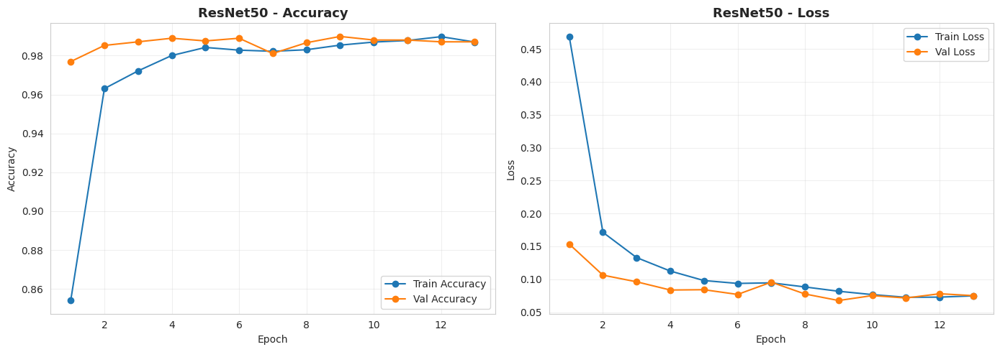

ResNet50 - Best Val Accuracy: 0.9898  |  Best Val Loss: 0.0677
68/68 ━━━━━━━━━━━━━━━━━━━━ 14s 153ms/step

Classification Report - ResNet50
              precision    recall  f1-score   support

   Black Rot       1.00      0.96      0.98       566
        ESCA       0.97      1.00      0.98       576
     Healthy       1.00      1.00      1.00       507
 Leaf Blight       1.00      1.00      1.00       516

    accuracy                           0.99      2165
   macro avg       0.99      0.99      0.99      2165
weighted avg       0.99      0.99      0.99      2165



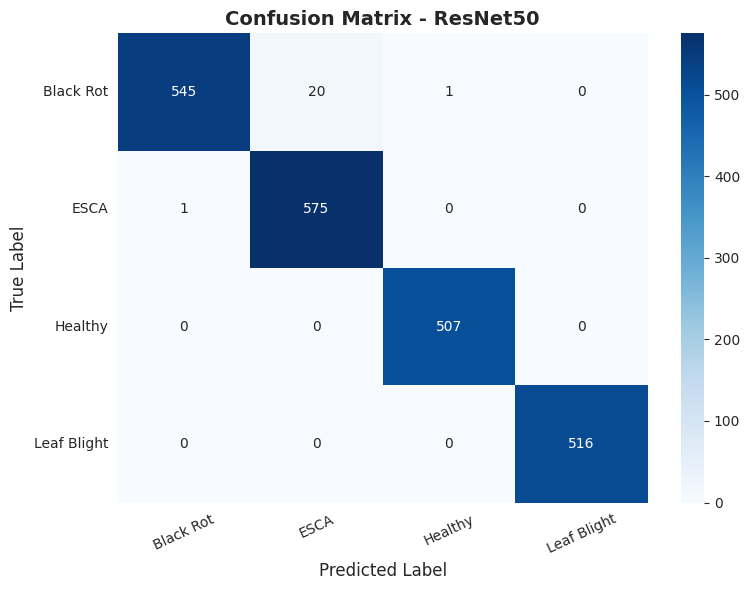

Mean confidence (correct):   0.9901
Mean confidence (incorrect): 0.7034
Number of misclassified samples: 22 / 2165


In [50]:
# ============================================================
# Training and Evaluating ResNet50
# ============================================================
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# --- Build the ResNet50 transfer learning model ---
def build_resnet50(input_shape=(IMG_SIZE, IMG_SIZE, 3), num_classes=NUM_CLASSES):
    base_model = ResNet50(
        weights="imagenet",
        include_top=False,
        input_shape=input_shape
    )
    base_model.trainable = False

    inputs = tf.keras.Input(shape=input_shape)

    # ResNet50's Keras preprocess_input expects raw [0, 255] pixel values
    # and converts RGB -> BGR then zero-centers using ImageNet means. Our
    # generators scale to [0, 1] via rescale=1./255, so undo that first,
    # then apply the model-specific preprocessing.
    x = tf.keras.layers.Rescaling(255.0)(inputs)
    x = tf.keras.applications.resnet50.preprocess_input(x)

    x = base_model(x, training=False)
    x = GlobalAveragePooling2D()(x)
    x = Dense(256, activation="relu", kernel_regularizer=tf.keras.regularizers.l2(1e-4))(x)
    x = Dropout(0.3)(x)
    outputs = Dense(num_classes, activation="softmax")(x)

    model = Model(inputs, outputs, name="ResNet50")
    return model, base_model

resnet50_model, resnet50_base = build_resnet50()
resnet50_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

total_params = resnet50_model.count_params()
trainable_params = sum([tf.keras.backend.count_params(w) for w in resnet50_model.trainable_weights])
print(f"Total parameters: {total_params:,}")
print(f"Trainable parameters: {trainable_params:,}")
print(f"Frozen parameters: {total_params - trainable_params:,}")

resnet50_model.summary()

# --- Train ---
resnet50_callbacks = [
    EarlyStopping(monitor="val_loss", patience=4, restore_best_weights=True),
    ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=2, min_lr=1e-6)
]

resnet50_history = resnet50_model.fit(
    train_generator,
    epochs=EPOCHS,
    validation_data=val_generator,
    callbacks=resnet50_callbacks,
    verbose=1
)

final_train_acc = resnet50_history.history["accuracy"][-1]
final_val_acc = resnet50_history.history["val_accuracy"][-1]
print(f"ResNet50 Final Train Accuracy: {final_train_acc:.4f}  |  Final Val Accuracy: {final_val_acc:.4f}")

# --- Plot training curves ---
def plot_training_curves(history, model_name):
    acc = history.history["accuracy"]
    val_acc = history.history["val_accuracy"]
    loss = history.history["loss"]
    val_loss = history.history["val_loss"]
    epochs_range = range(1, len(acc) + 1)

    plt.figure(figsize=(14, 5))

    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, acc, label="Train Accuracy", marker="o")
    plt.plot(epochs_range, val_acc, label="Val Accuracy", marker="o")
    plt.title(f"{model_name} - Accuracy", fontsize=13, fontweight="bold")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.legend()
    plt.grid(alpha=0.3)

    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, loss, label="Train Loss", marker="o")
    plt.plot(epochs_range, val_loss, label="Val Loss", marker="o")
    plt.title(f"{model_name} - Loss", fontsize=13, fontweight="bold")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()
    plt.grid(alpha=0.3)

    plt.tight_layout()
    plt.show()

plot_training_curves(resnet50_history, "ResNet50")

# --- Confusion matrix + classification report ---
def evaluate_model(model, generator, model_name):
    generator.reset()
    predictions = model.predict(generator, verbose=1)
    predicted_classes = np.argmax(predictions, axis=1)
    prediction_confidences = np.max(predictions, axis=1)
    true_classes = generator.classes
    class_labels = list(generator.class_indices.keys())

    print(f"\n{'='*60}")
    print(f"Classification Report - {model_name}")
    print(f"{'='*60}")
    print(classification_report(true_classes, predicted_classes, target_names=class_labels))

    cm = confusion_matrix(true_classes, predicted_classes)

    plt.figure(figsize=(8, 6))
    sns.heatmap(
        cm, annot=True, fmt="d", cmap="Blues",
        xticklabels=class_labels,
        yticklabels=class_labels
    )
    plt.title(f"Confusion Matrix - {model_name}", fontsize=14, fontweight="bold")
    plt.xlabel("Predicted Label", fontsize=12)
    plt.ylabel("True Label", fontsize=12)
    plt.xticks(rotation=25)
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()

    correct_mask = predicted_classes == true_classes
    print(f"Mean confidence (correct):   {prediction_confidences[correct_mask].mean():.4f}")
    if (~correct_mask).sum() > 0:
        print(f"Mean confidence (incorrect): {prediction_confidences[~correct_mask].mean():.4f}")
    print(f"Number of misclassified samples: {(~correct_mask).sum()} / {len(true_classes)}")

    return predicted_classes, true_classes

resnet50_val_loss, resnet50_val_acc = resnet50_model.evaluate(val_generator, verbose=0)
print(f"ResNet50 - Best Val Accuracy: {resnet50_val_acc:.4f}  |  Best Val Loss: {resnet50_val_loss:.4f}")

resnet50_preds, resnet50_true = evaluate_model(resnet50_model, val_generator, "ResNet50")